# Effect of the same fault injected at different moment in the algorithm execution

In [1]:
%matplotlib inline

In [2]:
# For plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import LogNorm
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

# For parsing Matrix files
import scipy.io

import numpy as np

## Import modules

In [3]:
from Experiment import *
from Parameters import *
from Fault import *
from Algorithm import *

## Define inputs

In [4]:
inputs = []

In [5]:
def load_mat(path='./arc130.mat'):
    
    try:
        A = scipy.io.loadmat(path)['Problem'][0][0][1].toarray()
    except:
        A = scipy.io.loadmat(path)['Problem'][0][0][2].toarray()
    print A
    n = A.shape[0]
    x = np.ones((n, 1))
    b = A.dot(x)
    x = np.zeros((n, 1))
    return A, x, b

[[ 0.00053701 -0.00044444  0.00013072 ...,  0.          0.          0.        ]
 [-0.00044444  0.00503658 -0.00022222 ...,  0.          0.          0.        ]
 [ 0.00013072 -0.00022222  0.00200426 ...,  0.          0.          0.        ]
 ..., 
 [ 0.          0.          0.         ...,  0.04928461  0.          0.0017255 ]
 [ 0.          0.          0.         ...,  0.          0.05011933  0.        ]
 [ 0.          0.          0.         ...,  0.0017255   0.          0.01365167]]
0.130187993097
3.94752749159e-06


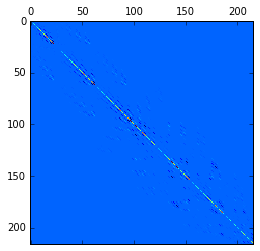

In [6]:
mat_path = './arc130.mat'
mat_path = './gre_216a.mat'
mat_path = './mcca.mat'
mat_path = './robot.mat'
mat_path = './ex1.mat'
A, x, b = load_mat(mat_path)
plt.matshow(A)
n = A.shape[0]
u, s, v = np.linalg.svd(A)
print s[0]
print s[-1]

In [7]:
inputs += [{"A": A, "b": b, "x0": x}]

## Define the algorithm

In [8]:
import gmres

#### Algorithm parameters

In [9]:
# parameters that won't change during the whole experiment
algorithm_parameters = Parameters()
algorithm_parameters["m"] = n
algorithm_parameters["tol"] = 1.e-12
algorithm_parameters["iterMax"] = n
algorithm_parameters["orthMethod"] = gmres.modified_gramschmidt
algorithm_parameters["dtype"] = 'd'
algorithm_parameters["vulnerable"] = True
algorithm_parameters["save_data"] = {"iteration_count",
                                     "residual",
                                     "residuals",
                                     "true_residual",
                                     "true_residuals",
                                     "orthogonality",
                                     "arnoldi",
                                     "faults",
                                     "H",
                                     "V",
                                     "y"}


#### Implementation (gmres)

In [10]:
def implementation(self, input, algorithm_parameters, experiment_parameters, save_data=True, display=False):
    gmres.implementation(self, input, algorithm_parameters, experiment_parameters, save_data, display)

In [11]:
gmres_algorithm = Algorithm(algorithm_parameters, implementation)

## Run the experiment

### Define the experiment parameters

In [12]:
from sys import stdout

experiment_parameters_without_fault = Parameters()

experiment_parameters_without_fault["vulnerable"] = False

orthMethods = []
orthMethods += [gmres.modified_gramschmidt]
orthMethods += [gmres.classical_gramschmidt]
orthMethods += [lambda w, V, H, i: gmres.modified_gramschmidt(w, V, H, i, True)]
  


def experiment_parameters_generator():
    parameters = Parameters()
    parameters["vulnerable"] = True
    
    fault_parameters = {}
    fault_parameters["fault_callback"] = lambda fault: (stdout.write(" %s " % str(fault)))
    fault_parameters["register"] = "left"
    
    while (True):
        fault_parameters["vulnerable_bits"] = [int(np.random.rand() * 64)]
        fault_parameters["fault_indices"] = {"i": int(np.random.rand()*n), 
                                             "j":0, 
                                             "k":int(np.random.rand()*n)}
        fault_parameters["timer"] = int(np.random.rand() * 150)
        
        parameters["fault_parameters"] = fault_parameters
        
        step = 5
        for i in xrange(215 / step + 1):
            fault_parameters["timer"] = step * i
            yield parameters



### Setup the experiment (algorithm, parameters and inputs)

In [13]:
# Experiment without fault
F = Experiment(experiment_parameters_without_fault, gmres_algorithm)
F.set_inputs(inputs)
F.run(show_progress=True, n=1)

print F.get_data("faults")

Complete ! 
[[]]


In [14]:
# Experiment with fault
E = Experiment(experiment_parameters_generator(), gmres_algorithm)
E.set_inputs(inputs)
E.run(show_progress=True, n=(215/5 + 1)*5)

40 %  {'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -9.42194395410143e-06, 'register': 'left', 'timer': 0, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 7.9954801319600651e+290}  {'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -4.4848262781370792e-06, 'register': 'left', 'timer': 5, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.4660712487533339e+301} 

gmres.py:104: RuntimeWarning: overflow encountered in double_scalars
  mu = np.sqrt(H[i, i]**2 + H[i+1, i]**2)
gmres.py:106: RuntimeWarning: invalid value encountered in double_scalars
  sn_i = -H[i+1, i] / mu


Complete ! 


## Display the experiment result

In [15]:
E.get_results()[0]

({'A': array([[ 0.00053701, -0.00044444,  0.00013072, ...,  0.        ,
           0.        ,  0.        ],
         [-0.00044444,  0.00503658, -0.00022222, ...,  0.        ,
           0.        ,  0.        ],
         [ 0.00013072, -0.00022222,  0.00200426, ...,  0.        ,
           0.        ,  0.        ],
         ..., 
         [ 0.        ,  0.        ,  0.        , ...,  0.04928461,
           0.        ,  0.0017255 ],
         [ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.05011933,  0.        ],
         [ 0.        ,  0.        ,  0.        , ...,  0.0017255 ,
           0.        ,  0.01365167]]), 'b': array([[  3.06482134e-13],
         [  3.35464633e-03],
         [  1.09458389e-12],
         [  1.19808797e-02],
         [  1.86997325e-02],
         [  3.05329066e-03],
         [  7.76137955e-03],
         [  1.09046095e-02],
         [  1.25894177e-02],
         [  2.77192127e-02],
         [  3.05665623e-02],
         [  4.55943453e-03],
   

## Display the experiment data

In [16]:
E.get_data()[0]

{'H': array([[  8.84641478e-02,   8.63615526e-02,   1.10331706e-02, ...,
           2.91750693e-05,   3.89625229e-05,   0.00000000e+00],
        [  0.00000000e+00,   4.50750485e-02,   3.37824720e-02, ...,
           7.43664240e-06,   9.93143657e-06,   0.00000000e+00],
        [  0.00000000e+00,   0.00000000e+00,   3.83180428e-02, ...,
           3.20716892e-06,   4.28308812e-06,   0.00000000e+00],
        ..., 
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   1.24550552e-05,   0.00000000e+00],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   0.00000000e+00]]),
 'V': array([[  8.31561835e-13,  -1.55466277e-04,   1.09924160e-03, ...,
           9.52626300e-03,   7.99368635e-04,   0.00000000e+00],
        [  9.10198523e-03,  -1.31997784e-02,   3.0

## Plot convergence history

In [17]:
def plot_2D(X, Y, title = '', grid = True, label = "", log=False, linestyle = None, xlabel = None, ylabel = None, xlim = None, ylim = None):

    if log:
        p = plt.semilogy(X, Y[:len(X)], label=label)
    else:
        p = plt.plot(X, Y[:len(X)], label=label)
    if linestyle:
        plt.setp(p, linestyle=linestyle) 
    plt.title(title)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if grid:
        plt.grid(True)


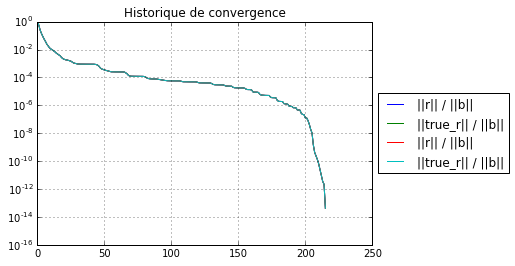

In [18]:
X = np.arange(0, F.get_data('iteration_count')[0]+1)
Y = F.get_data('residuals')[0]
Z = F.get_data('true_residuals')[0]

plot_2D(X, Y, log=True, title='Historique de convergence', label = "||r|| / ||b||", xlim=[0, 200], ylim=[1., 1.e-16])
plot_2D(X, Z, log=True, title='Historique de convergence', label = "||true_r|| / ||b||", xlim=[0, 210], ylim=[1., 1.e-16])
X = np.arange(0, E.get_data('iteration_count')[0]+1)
Y = E.get_data('residuals')[0]
Z = E.get_data('true_residuals')[0]

plot_2D(X, Y, log=True, title='Historique de convergence', label = "||r|| / ||b||", xlim=[0, 250], ylim=[1.e-16, 1])
plot_2D(X, Z, log=True, title='Historique de convergence', label = "||true_r|| / ||b||", xlim=[0, 250], ylim=[1.e-16, 1.])


{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0059592474362848234, 'register': 'left', 'timer': 0, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0059592474362845007, 'check': None}


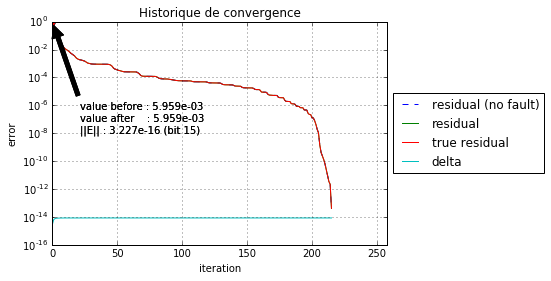

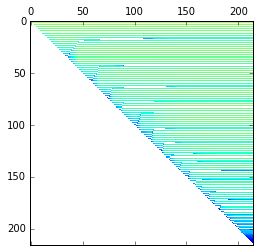

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0026820036899769138, 'register': 'left', 'timer': 5, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.0026820036899765833, 'check': None}


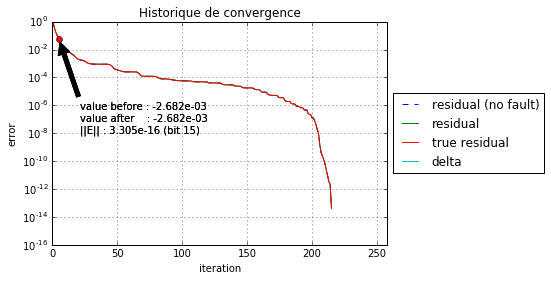

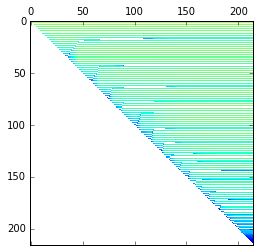

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.014185909644688773, 'register': 'left', 'timer': 10, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.014185909644686899, 'check': None}


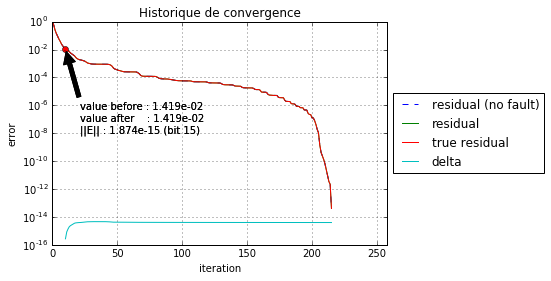

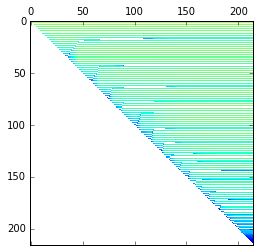

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.010294631519389547, 'register': 'left', 'timer': 15, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.010294631519390696, 'check': None}


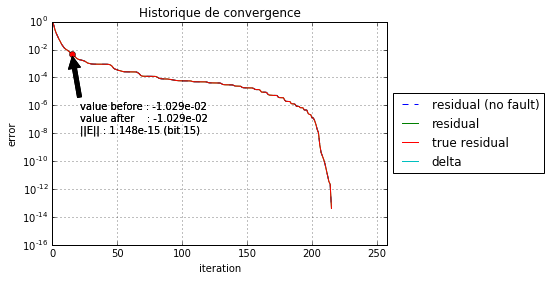

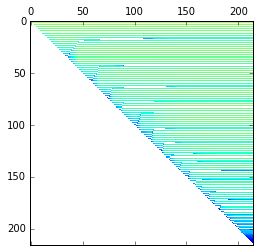

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.021036307313600618, 'register': 'left', 'timer': 20, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.021036307313599806, 'check': None}


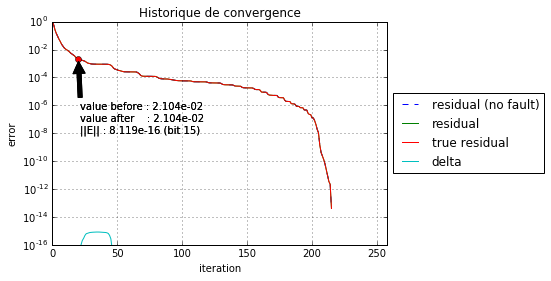

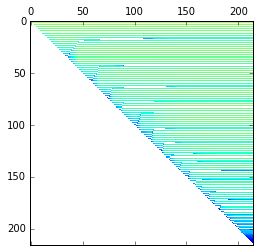

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00078163694039821649, 'register': 'left', 'timer': 25, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00078163694039786748, 'check': None}


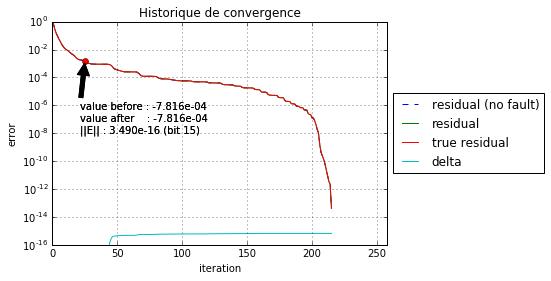

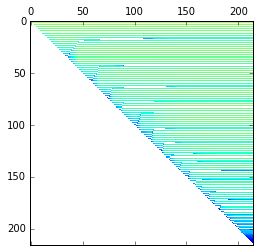

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.00032451321965973128, 'register': 'left', 'timer': 30, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.00032451321965981428, 'check': None}


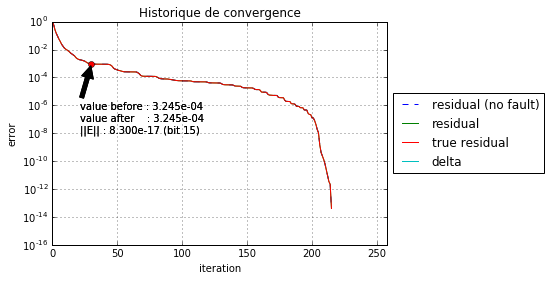

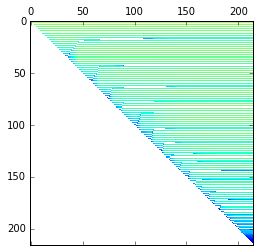

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.023174971778350768, 'register': 'left', 'timer': 35, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.02317497177835123, 'check': None}


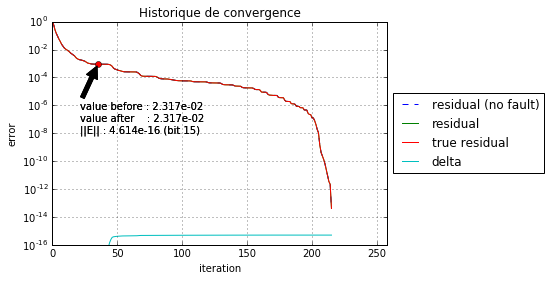

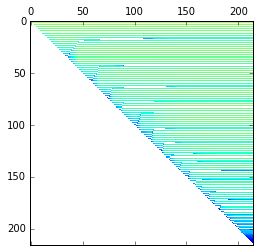

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0017436132558367205, 'register': 'left', 'timer': 40, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.0017436132558360799, 'check': None}


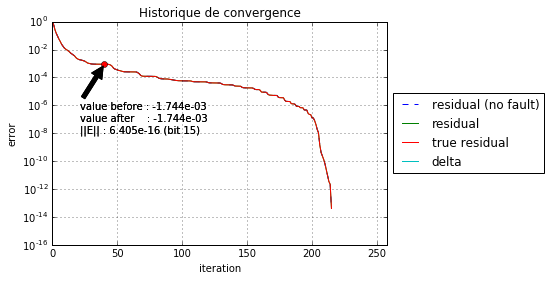

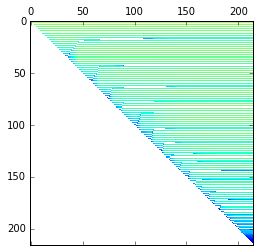

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00072964290051787269, 'register': 'left', 'timer': 45, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.000729642900517896, 'check': None}


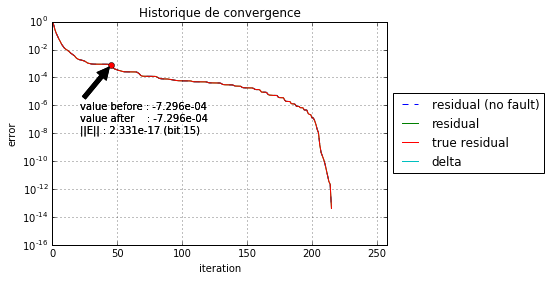

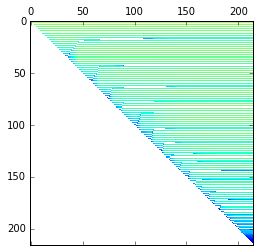

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0029181871193174054, 'register': 'left', 'timer': 50, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0029181871193161282, 'check': None}


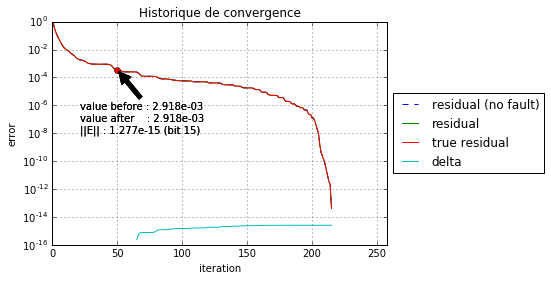

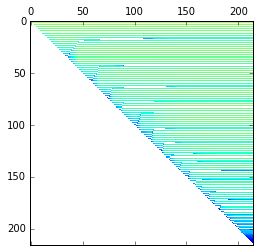

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0054048760582032836, 'register': 'left', 'timer': 55, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.0054048760582036141, 'check': None}


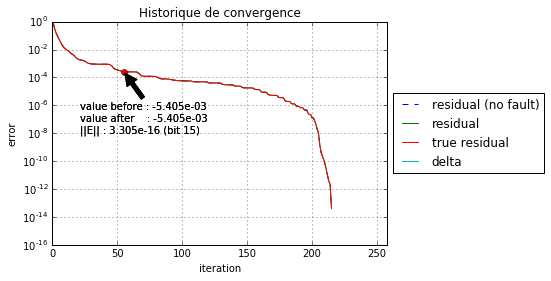

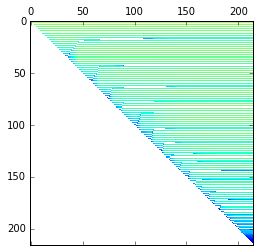

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0046151186204136992, 'register': 'left', 'timer': 60, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.004615118620413609, 'check': None}


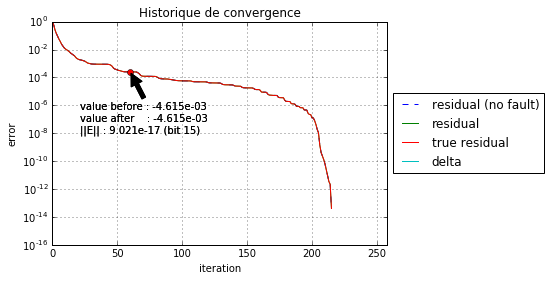

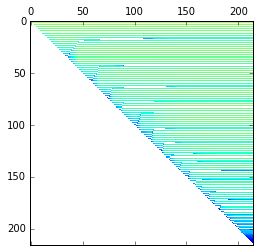

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0043658954446535109, 'register': 'left', 'timer': 65, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.0043658954446533912, 'check': None}


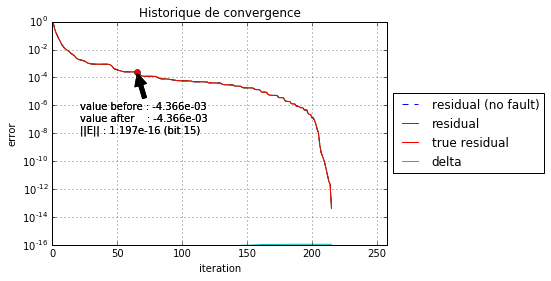

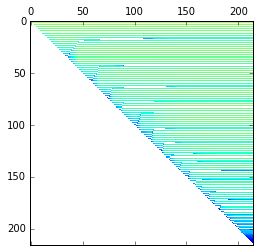

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.014063554524852185, 'register': 'left', 'timer': 70, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.014063554524853791, 'check': None}


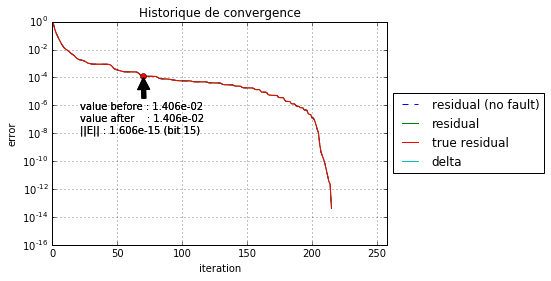

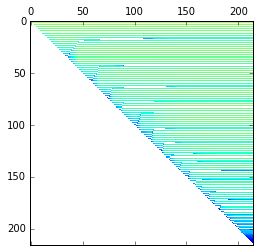

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.00710375186460352, 'register': 'left', 'timer': 75, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0071037518646038297, 'check': None}


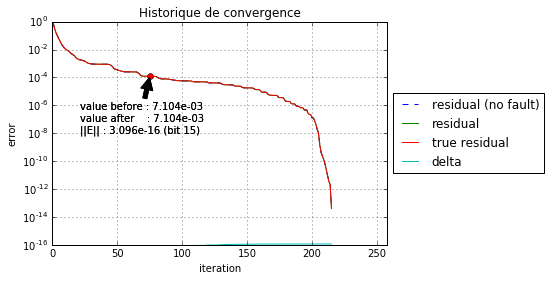

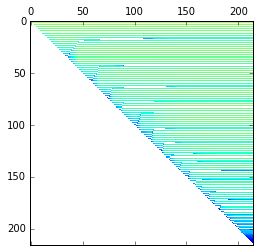

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -3.470170681368197e-05, 'register': 'left', 'timer': 80, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -3.4701706814892861e-05, 'check': None}


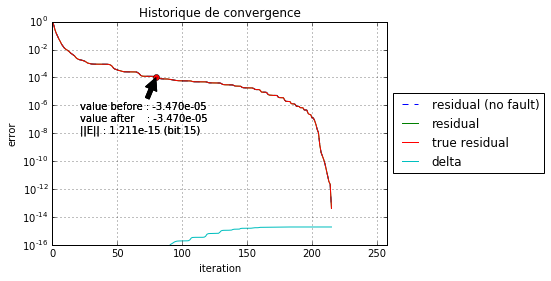

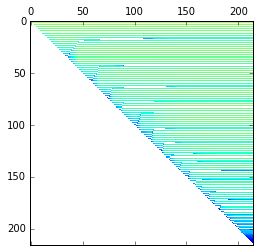

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.00036970571422732248, 'register': 'left', 'timer': 85, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.00036970571422810007, 'check': None}


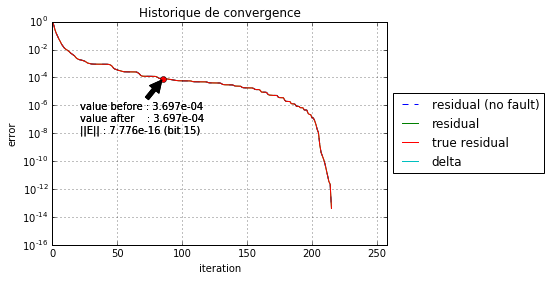

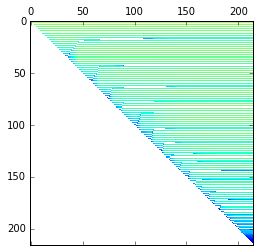

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0013808834885667897, 'register': 'left', 'timer': 90, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0013808834885676909, 'check': None}


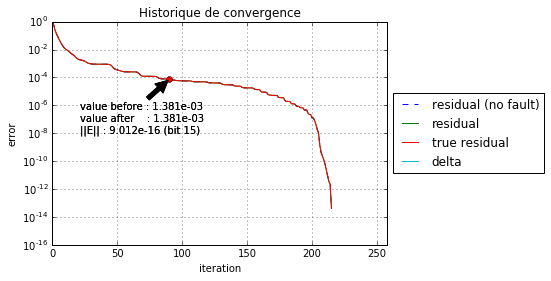

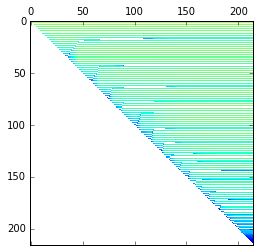

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0010096059522725011, 'register': 'left', 'timer': 95, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.001009605952272078, 'check': None}


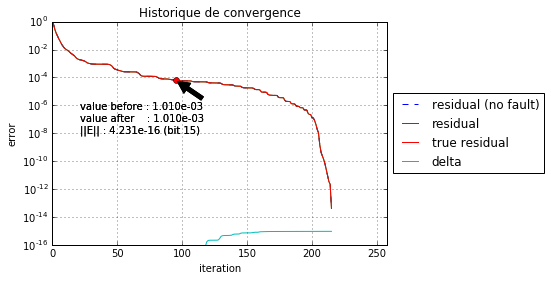

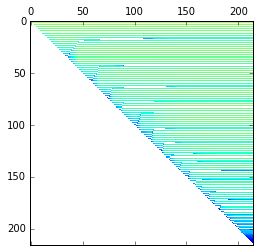

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0027514972352331566, 'register': 'left', 'timer': 100, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0027514972352331141, 'check': None}


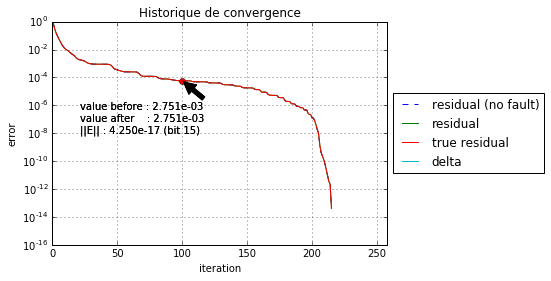

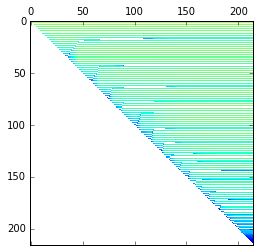

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0014645611107797921, 'register': 'left', 'timer': 105, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0014645611107797891, 'check': None}


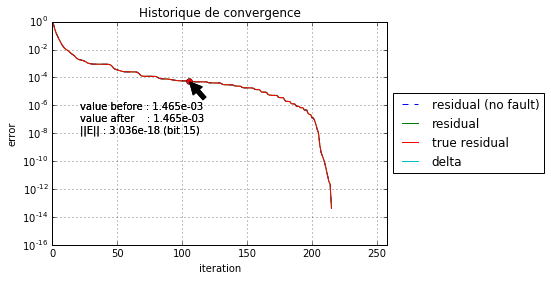

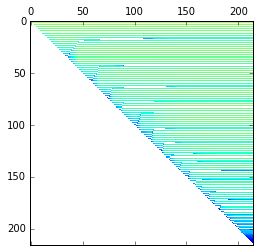

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0017738700823850101, 'register': 'left', 'timer': 110, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0017738700823836154, 'check': True}


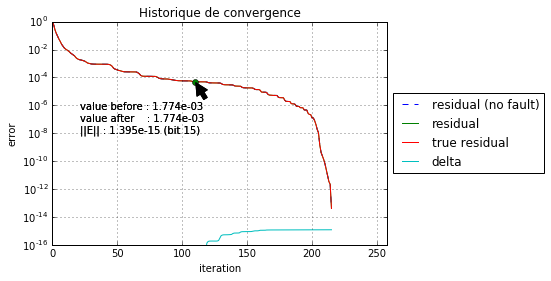

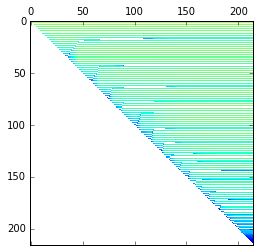

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.00070255517040041882, 'register': 'left', 'timer': 115, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.00070255517040049948, 'check': True}


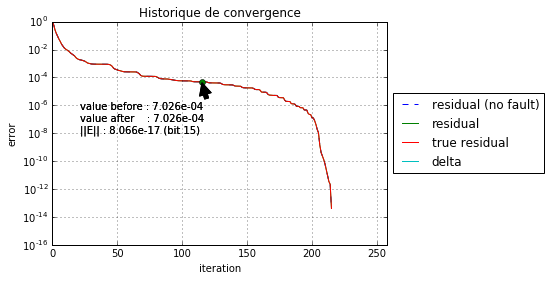

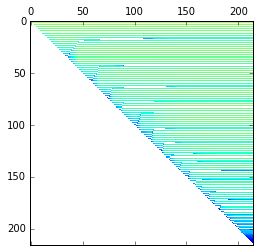

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0011829608247297049, 'register': 'left', 'timer': 120, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0011829608247307009, 'check': True}


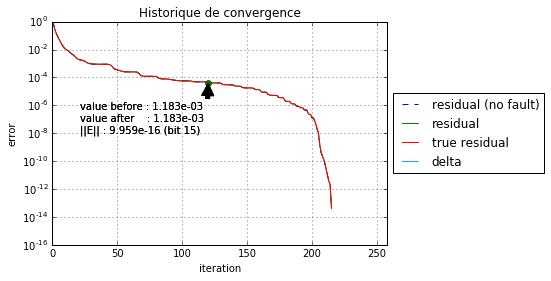

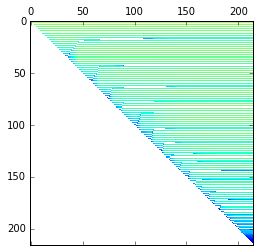

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.0014475869034305605, 'register': 'left', 'timer': 125, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.0014475869034311288, 'check': True}


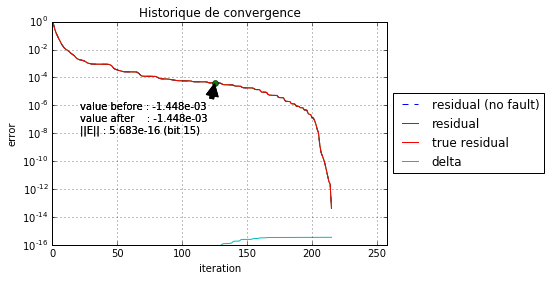

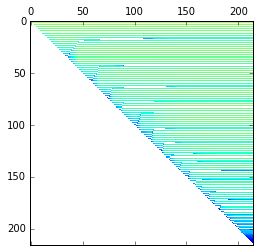

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 7.1075413089450267e-05, 'register': 'left', 'timer': 130, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 7.1075413090149252e-05, 'check': True}


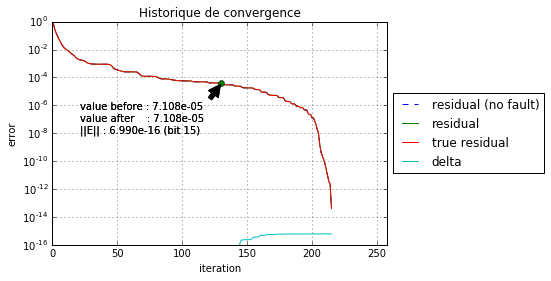

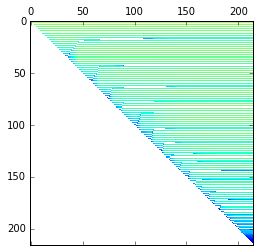

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0016766209676179007, 'register': 'left', 'timer': 135, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0016766209676181659, 'check': True}


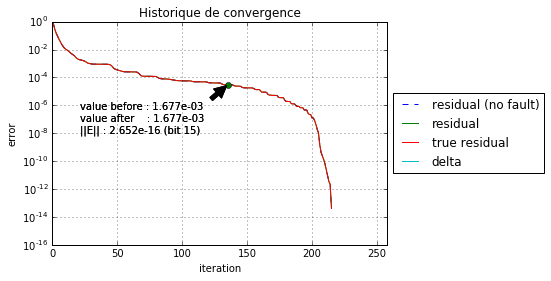

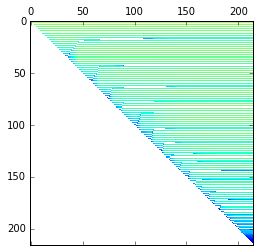

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 6.7506250829032404e-05, 'register': 'left', 'timer': 140, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 6.7506250830220689e-05, 'check': True}


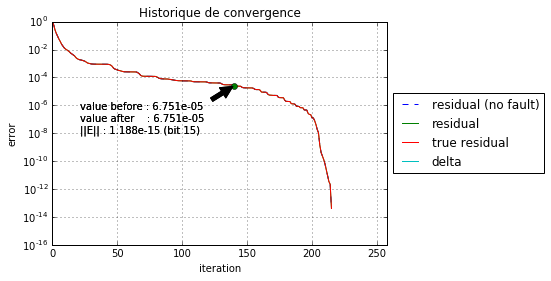

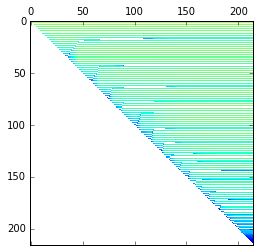

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00038857025871401145, 'register': 'left', 'timer': 145, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00038857025871575219, 'check': True}


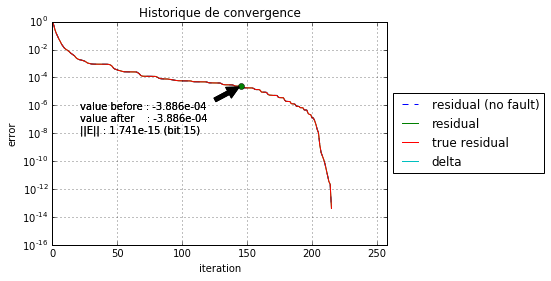

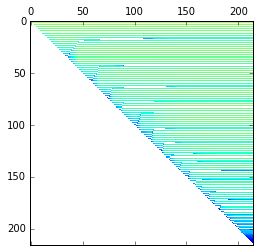

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 5.3479151421154424e-05, 'register': 'left', 'timer': 150, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 5.3479151420903669e-05, 'check': True}


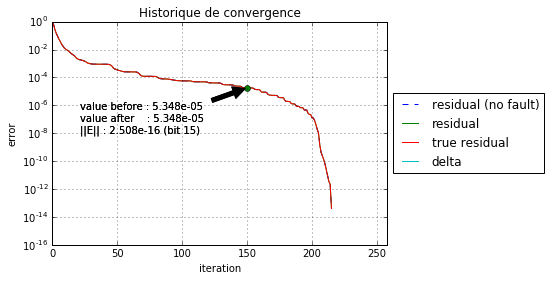

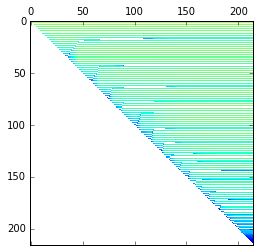

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00076673605858673774, 'register': 'left', 'timer': 155, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00076673605858704826, 'check': True}


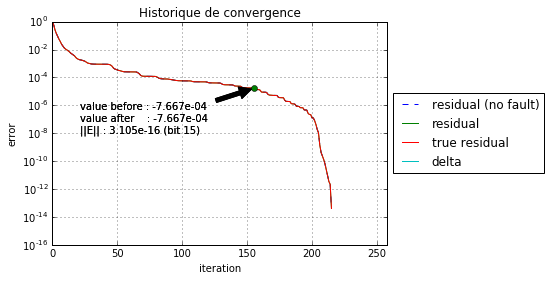

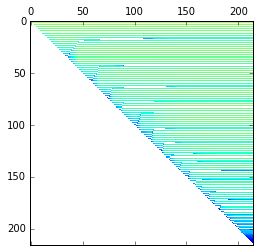

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.0017378017290253678, 'register': 'left', 'timer': 160, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.0017378017290255029, 'check': True}


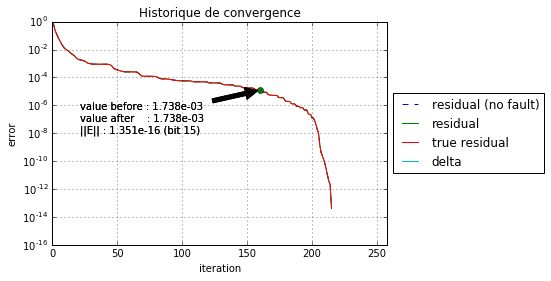

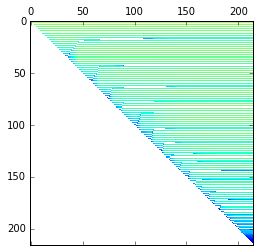

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00022544887712026889, 'register': 'left', 'timer': 165, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00022544887711767135, 'check': True}


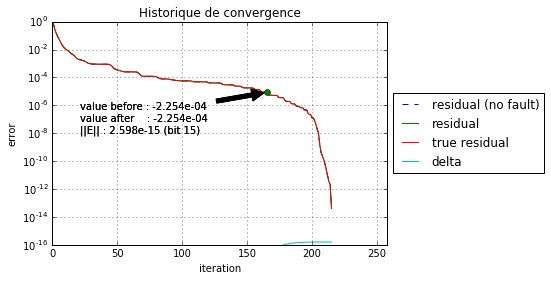

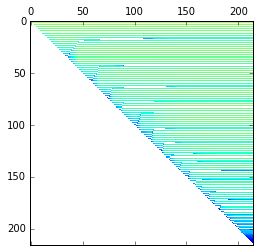

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00065205535500758357, 'register': 'left', 'timer': 170, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00065205535500961797, 'check': True}


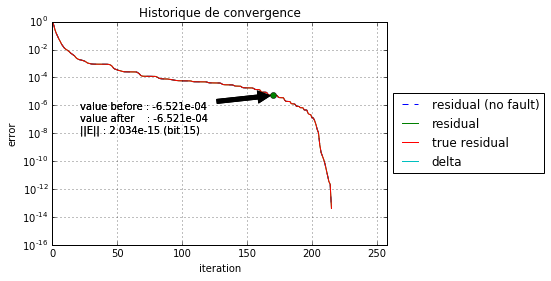

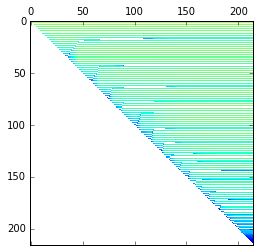

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00080525908910017766, 'register': 'left', 'timer': 175, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00080525908909997318, 'check': True}


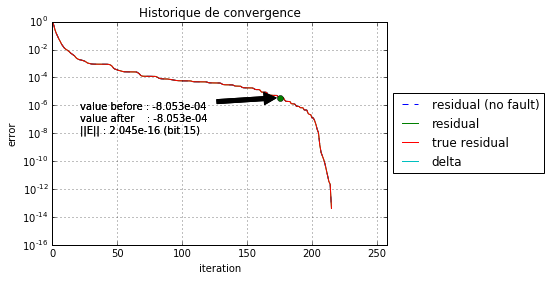

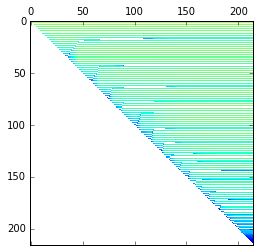

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': 0.00075049000311376438, 'register': 'left', 'timer': 180, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': 0.00075049000311383171, 'check': True}


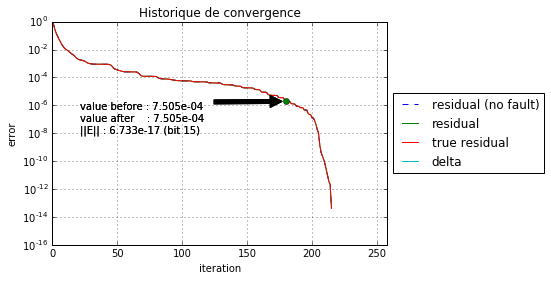

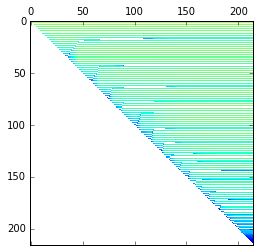

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00019479176409447, 'register': 'left', 'timer': 185, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00019479176409331888, 'check': True}


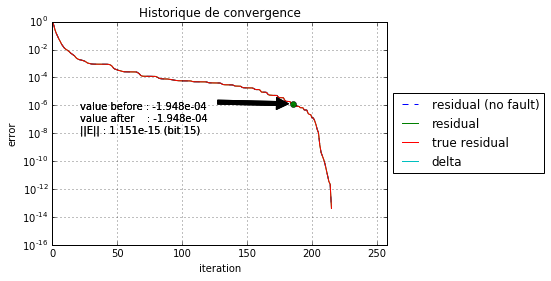

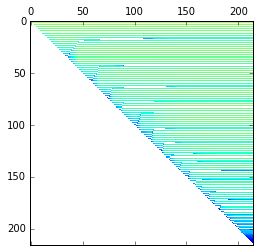

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00041478721099905212, 'register': 'left', 'timer': 190, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00041478721099706418, 'check': True}


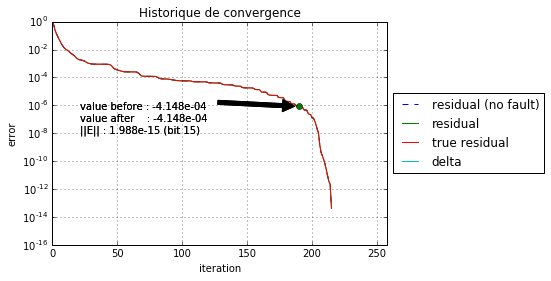

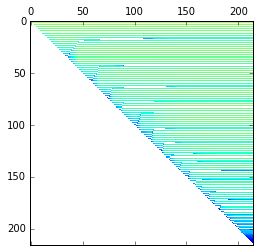

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -0.00036644704746369215, 'register': 'left', 'timer': 195, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -0.00036644704746438528, 'check': True}


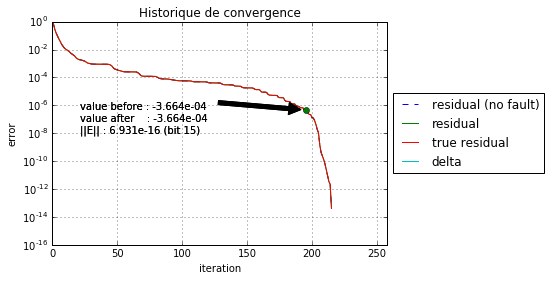

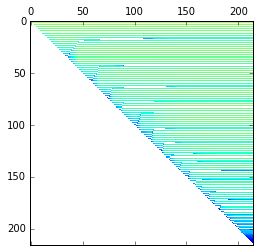

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -3.3919877426796122e-05, 'register': 'left', 'timer': 200, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -3.391987742687478e-05, 'check': True}


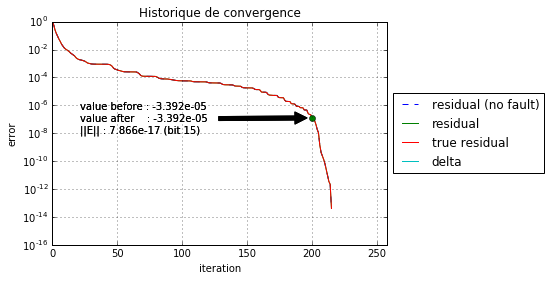

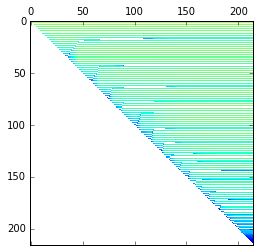

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -2.1263581468274751e-07, 'register': 'left', 'timer': 205, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -2.1263581466936015e-07, 'check': True}


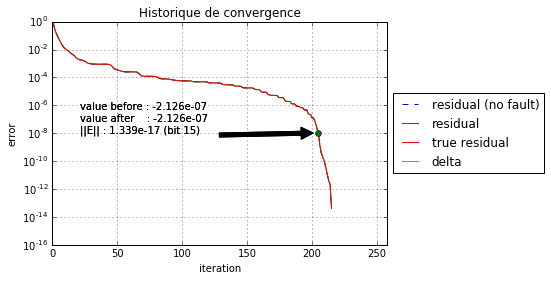

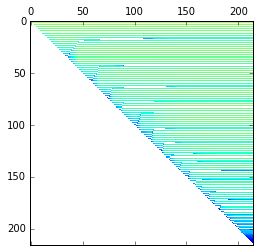

animation
{'register_before': -0.0027946578656613701, 'loc': {'i': 87, 'k': 80, 'j': 0}, 'value_before': -5.8116853857084224e-08, 'register': 'left', 'timer': 210, 'register_after': -0.002794657865675581, 'bit': 15, 'value_after': -5.8116853941211536e-08, 'check': True}


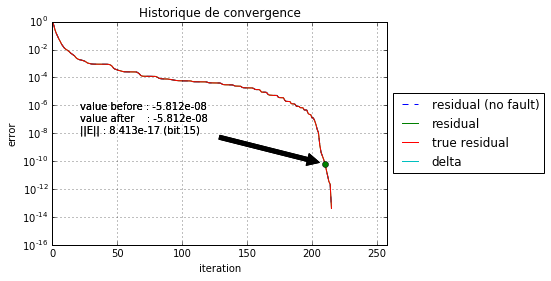

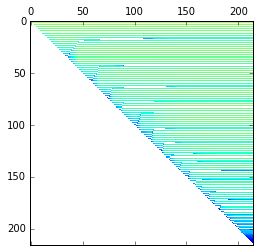

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.003021982872717308, 'register': 'left', 'timer': 0, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0030224706767272794, 'check': None}


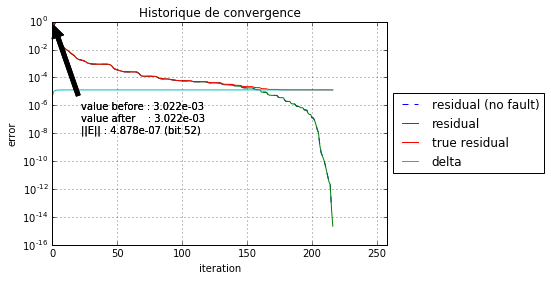

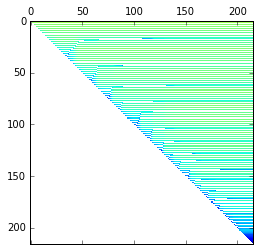

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0033784189449611495, 'register': 'left', 'timer': 5, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0033780710124632499, 'check': None}


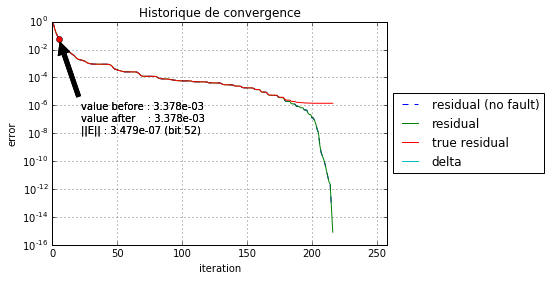

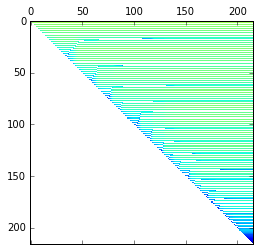

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.00072302163714082579, 'register': 'left', 'timer': 10, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0007231617191945011, 'check': None}


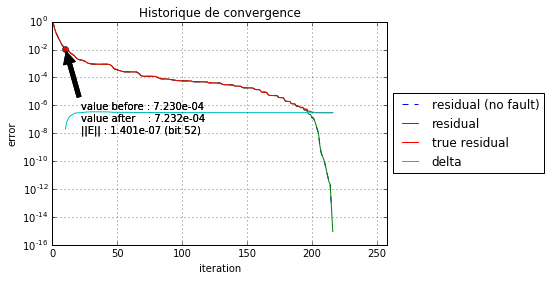

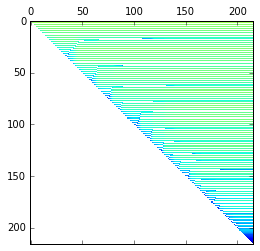

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0014488746486508641, 'register': 'left', 'timer': 15, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0014488663285023924, 'check': None}


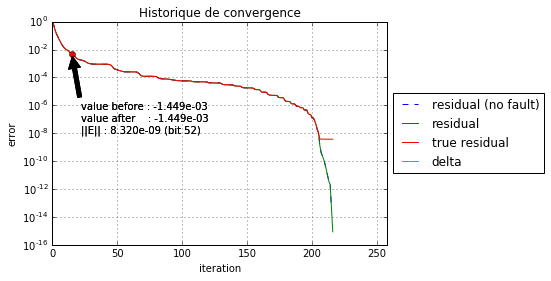

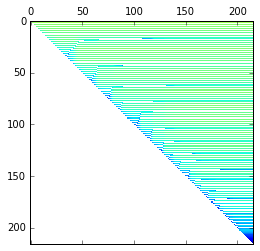

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0015503968572528205, 'register': 'left', 'timer': 20, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0015488296154010242, 'check': None}


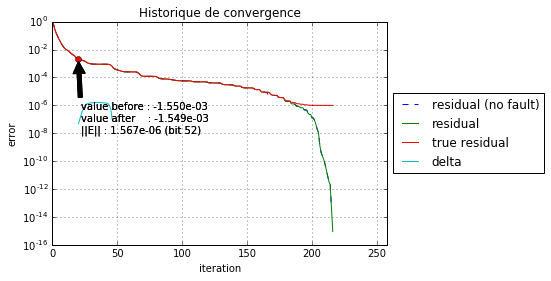

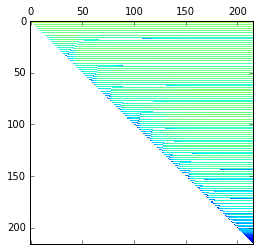

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0025933402961516119, 'register': 'left', 'timer': 25, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0025935768193003279, 'check': None}


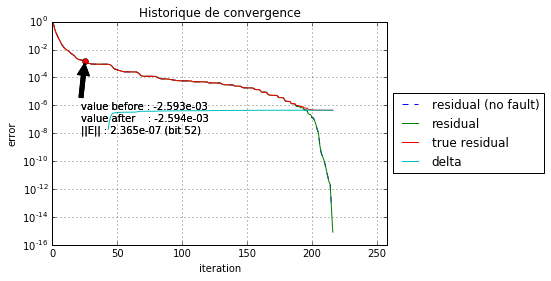

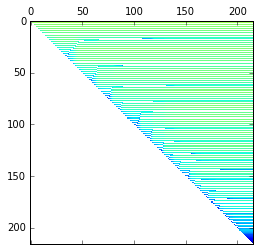

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0061504950157112541, 'register': 'left', 'timer': 30, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0061517687830702963, 'check': None}


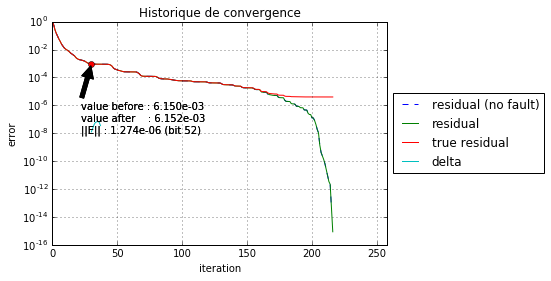

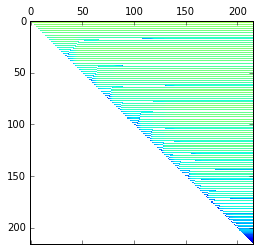

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.002783256498566815, 'register': 'left', 'timer': 35, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0027823227655350445, 'check': None}


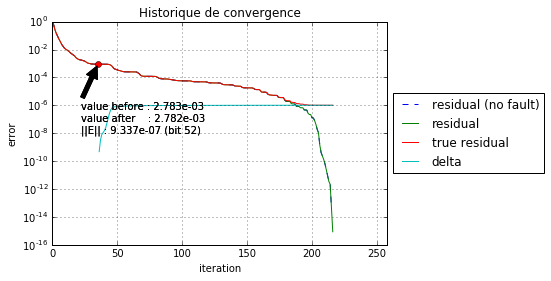

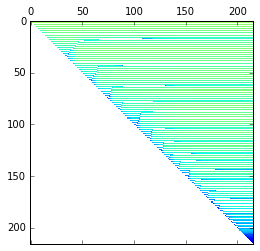

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0032401908125643704, 'register': 'left', 'timer': 40, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0032410613545457594, 'check': None}


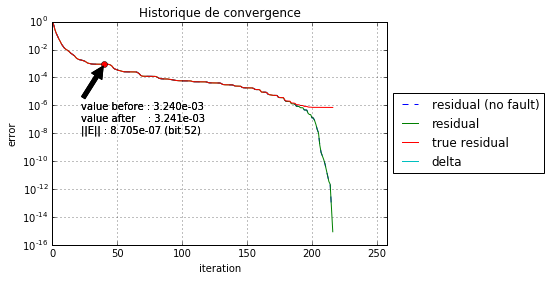

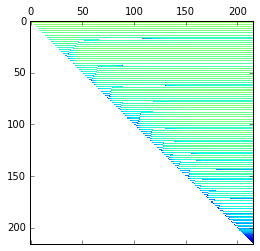

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0046691066752957196, 'register': 'left', 'timer': 45, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.004670538493649617, 'check': None}


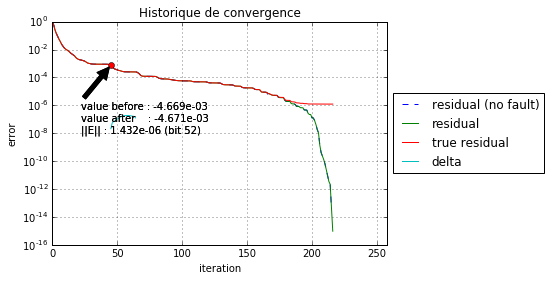

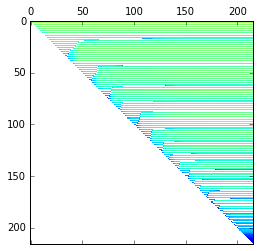

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0029257818532017646, 'register': 'left', 'timer': 50, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0029232601590024917, 'check': None}


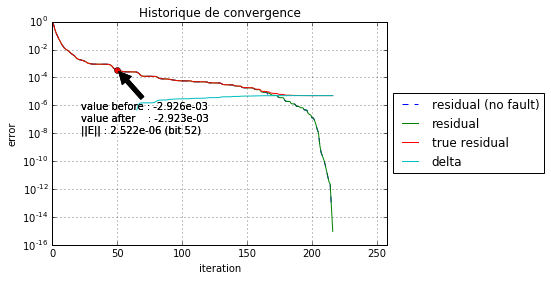

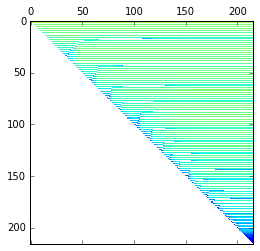

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0031783725333118275, 'register': 'left', 'timer': 55, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0031814137599328676, 'check': None}


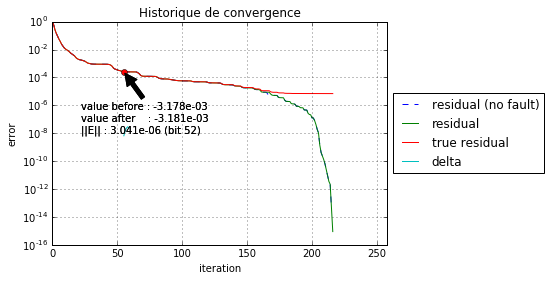

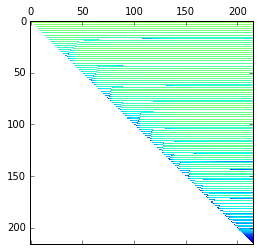

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0023362425957418474, 'register': 'left', 'timer': 60, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0023339838449355868, 'check': None}


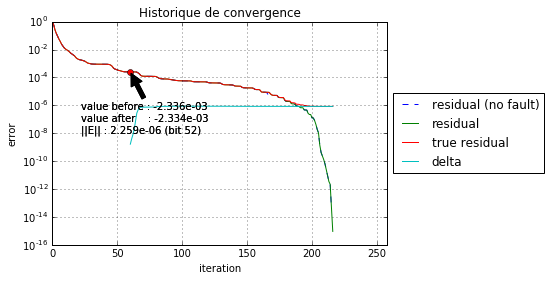

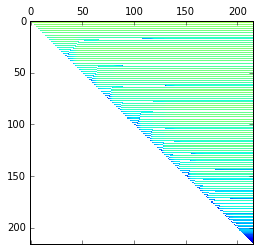

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0090776038750142972, 'register': 'left', 'timer': 65, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0090818066681848733, 'check': None}


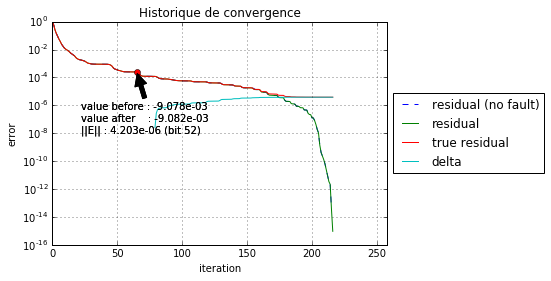

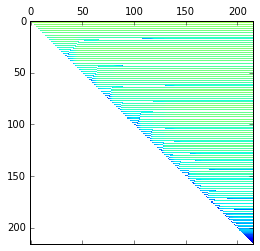

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0014074272864751584, 'register': 'left', 'timer': 70, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0014159800812819027, 'check': None}


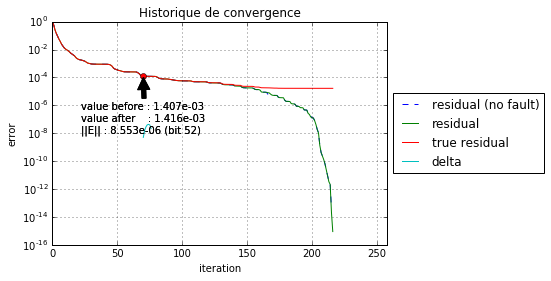

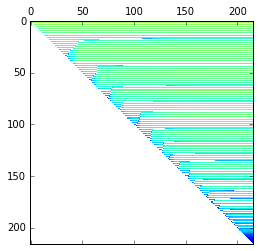

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0039507980301823524, 'register': 'left', 'timer': 75, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0039469333142529463, 'check': None}


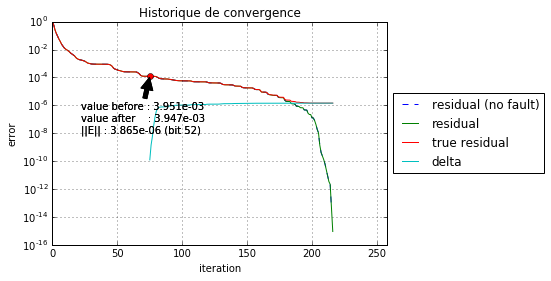

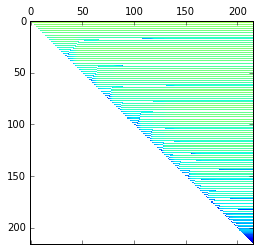

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0041528807631570743, 'register': 'left', 'timer': 80, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0041522208698772187, 'check': None}


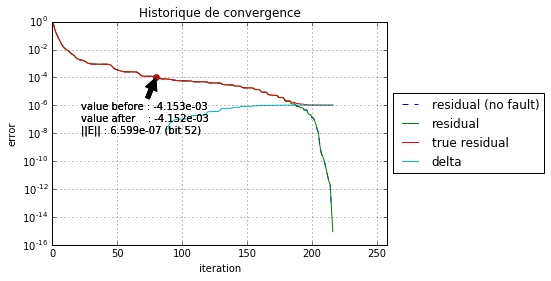

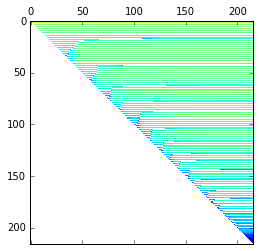

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0018491913177319549, 'register': 'left', 'timer': 85, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.00184906745129557, 'check': None}


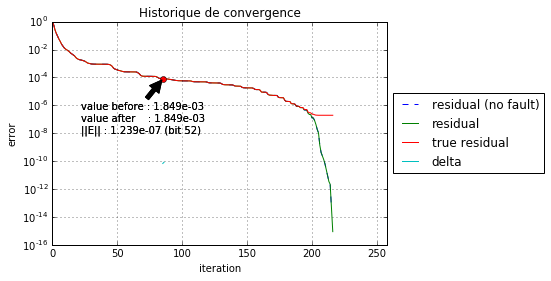

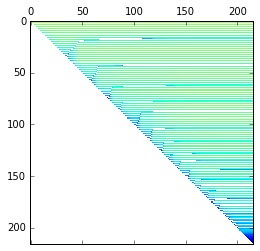

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0042602799479064066, 'register': 'left', 'timer': 90, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0042580130581479437, 'check': None}


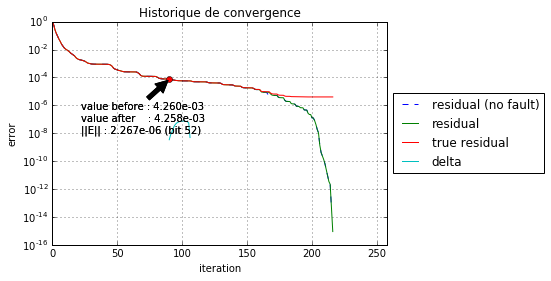

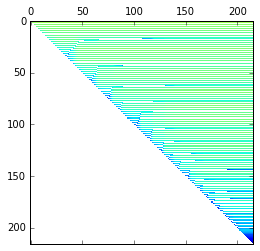

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.00095424129367533198, 'register': 'left', 'timer': 95, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.00095885074246657446, 'check': None}


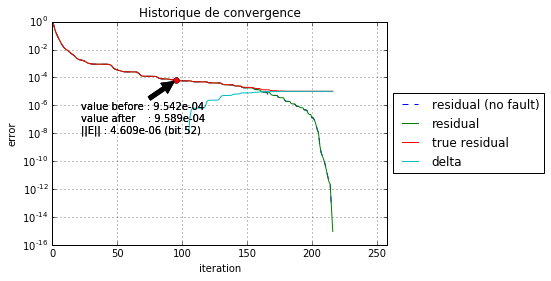

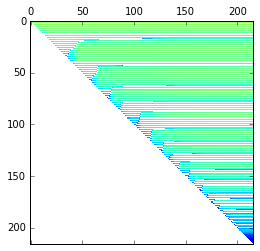

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0077051777860825165, 'register': 'left', 'timer': 100, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0077009288040879118, 'check': None}


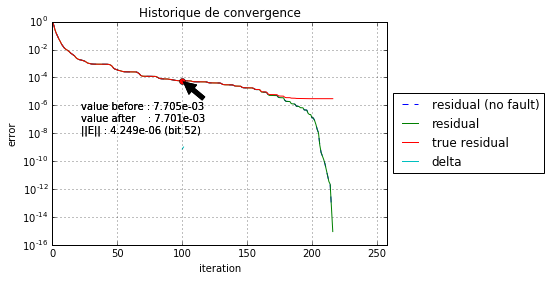

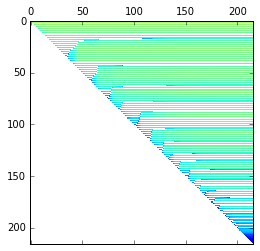

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.010776868385322356, 'register': 'left', 'timer': 105, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.010768272026413804, 'check': None}


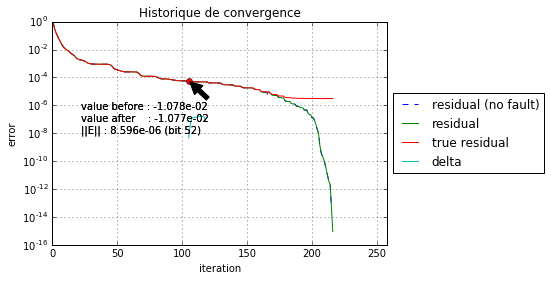

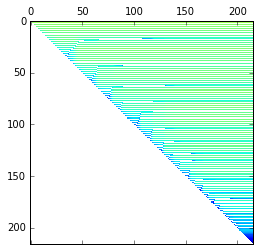

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0085140396574717777, 'register': 'left', 'timer': 110, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0085261012379838404, 'check': None}


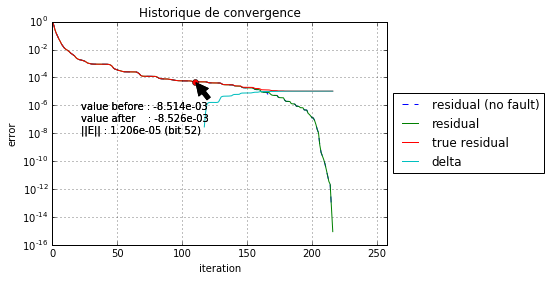

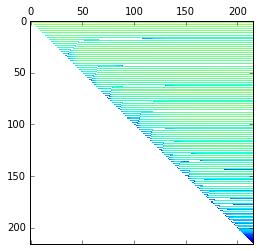

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0013520304081410899, 'register': 'left', 'timer': 115, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0013470699366622352, 'check': None}


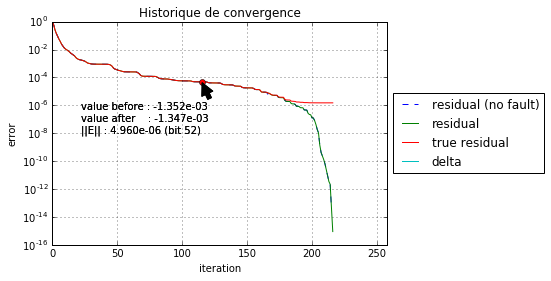

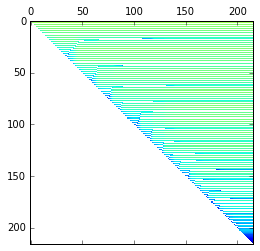

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00027304156939165418, 'register': 'left', 'timer': 120, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00027011223481140706, 'check': None}


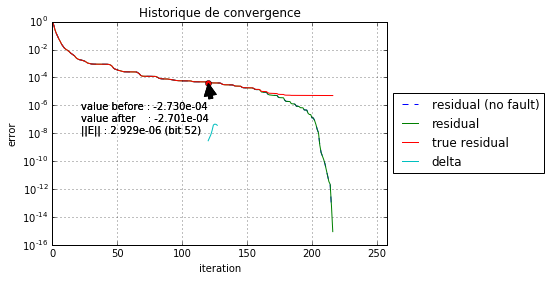

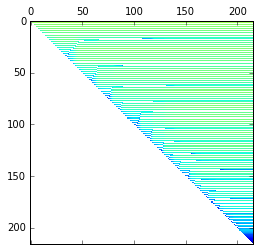

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0010858294012649427, 'register': 'left', 'timer': 125, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0010850427178275193, 'check': None}


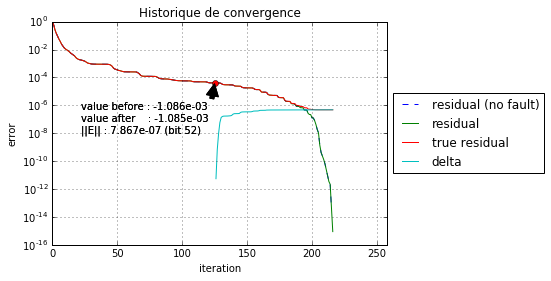

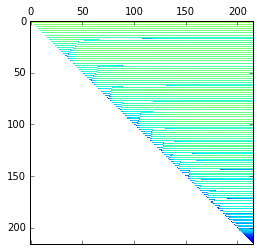

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0025742289854703742, 'register': 'left', 'timer': 130, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0025866733923269533, 'check': None}


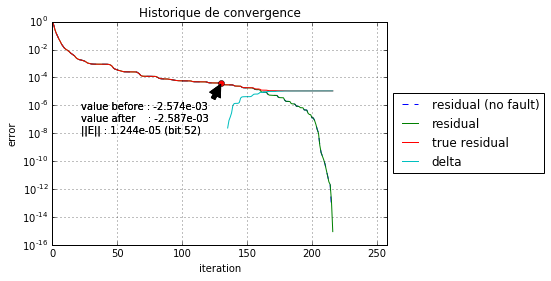

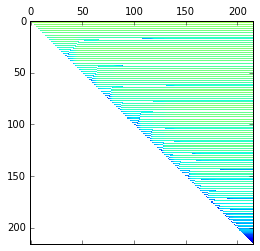

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0011575597306563257, 'register': 'left', 'timer': 135, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0011632442626254989, 'check': None}


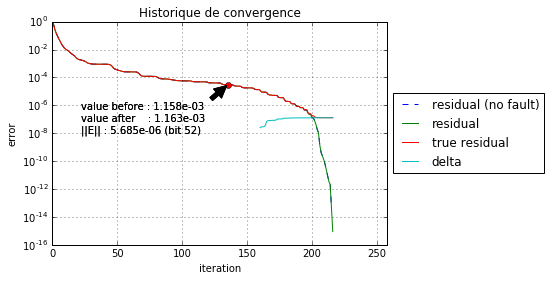

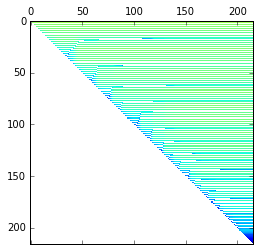

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.00073590266726662333, 'register': 'left', 'timer': 140, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.00071323996683779456, 'check': None}


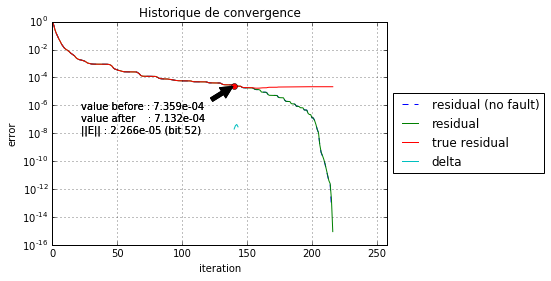

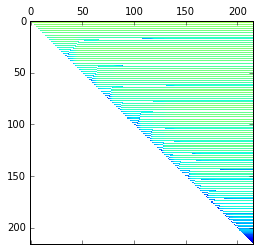

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0019116694326033426, 'register': 'left', 'timer': 145, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0019129006389136088, 'check': None}


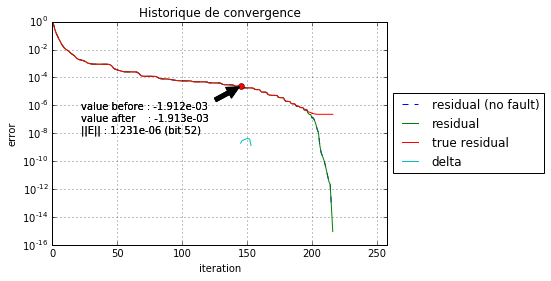

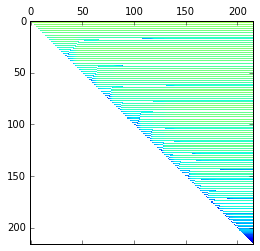

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00042517855869324365, 'register': 'left', 'timer': 150, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00042379576613475262, 'check': None}


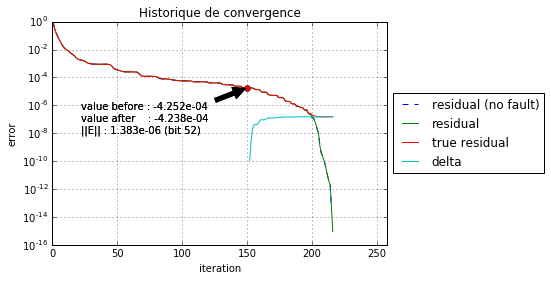

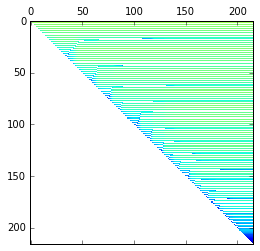

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0016780580694325396, 'register': 'left', 'timer': 155, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0016651784713731996, 'check': None}


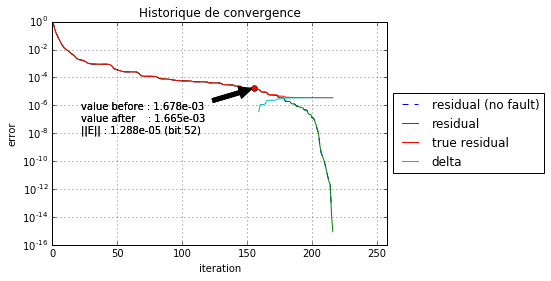

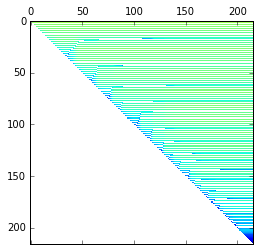

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0013160978962955072, 'register': 'left', 'timer': 160, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0013225229671593639, 'check': None}


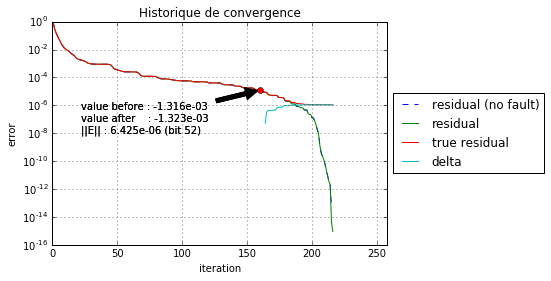

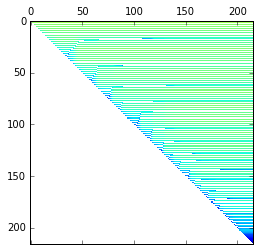

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00041327583345893517, 'register': 'left', 'timer': 165, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00040574682831510755, 'check': None}


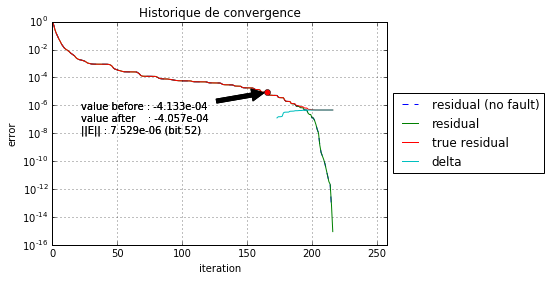

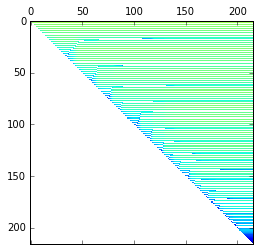

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00087773239947377978, 'register': 'left', 'timer': 170, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00088730094528202783, 'check': None}


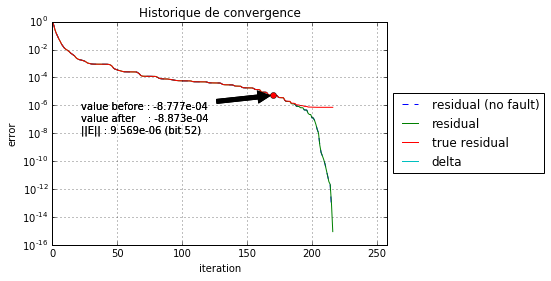

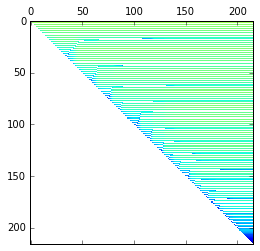

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.0008168985136208643, 'register': 'left', 'timer': 175, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.0007809227122478104, 'check': None}


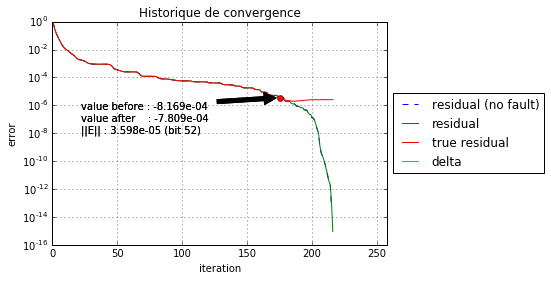

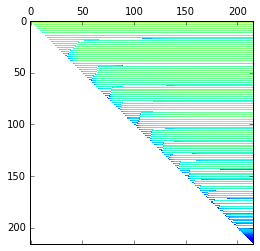

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00032857268407041301, 'register': 'left', 'timer': 180, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00032925415799484964, 'check': None}


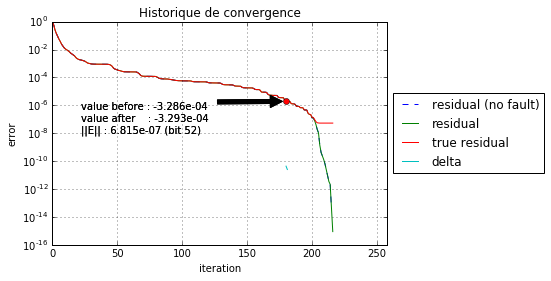

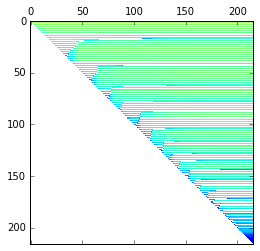

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': -0.00026266010800082124, 'register': 'left', 'timer': 185, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -0.00027187393706845826, 'check': None}


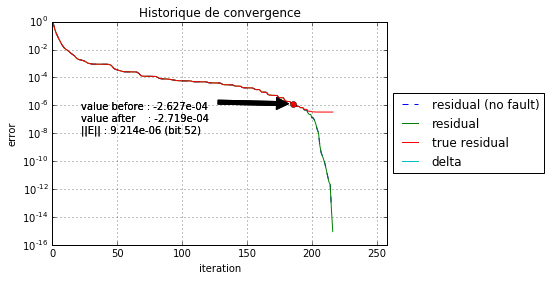

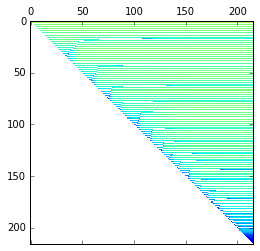

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.00038569403733558754, 'register': 'left', 'timer': 190, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.00037140416169307206, 'check': None}


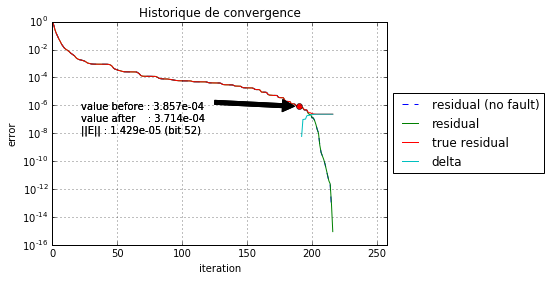

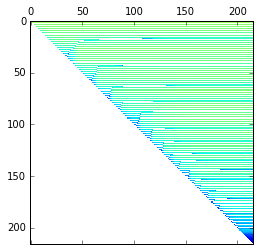

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.0026186210029711036, 'register': 'left', 'timer': 195, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.0026283964973798524, 'check': None}


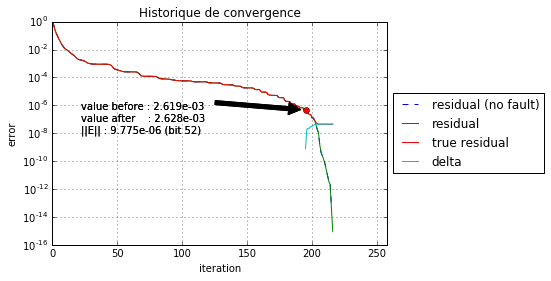

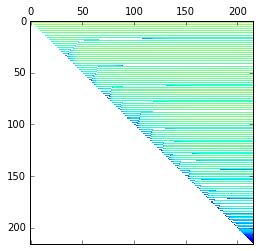

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 0.00011837396089219249, 'register': 'left', 'timer': 200, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': 0.00011132388895053008, 'check': None}


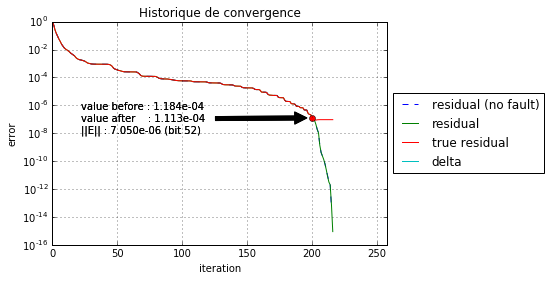

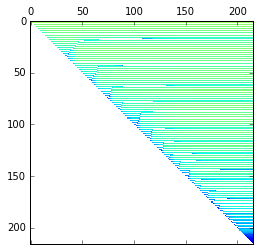

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 3.4567263154719203e-07, 'register': 'left', 'timer': 205, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -3.3100244040835688e-05, 'check': None}


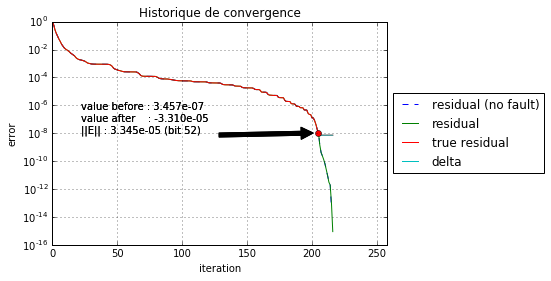

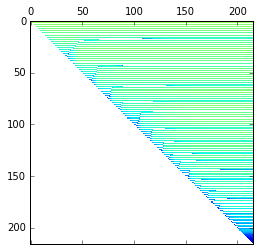

animation
{'register_before': 0.000293317195326066, 'loc': {'i': 42, 'k': 81, 'j': 0}, 'value_before': 7.2522462144137162e-08, 'register': 'left', 'timer': 210, 'register_after': 0.000146658597663033, 'bit': 52, 'value_after': -7.6367421341961201e-06, 'check': None}


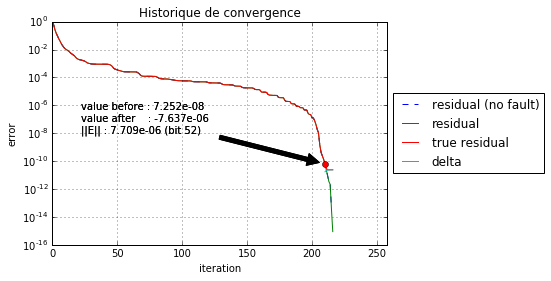

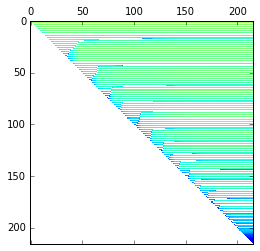

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -9.42194395410143e-06, 'register': 'left', 'timer': 0, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 7.9954801319600651e+290, 'check': None}


/usr/lib/python2.7/dist-packages/matplotlib/scale.py:93: RuntimeWarning: invalid value encountered in less_equal
  mask = a <= 0.0


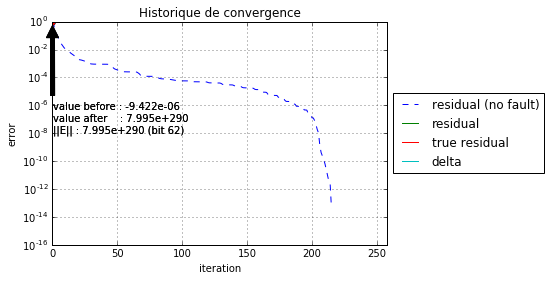

/usr/lib/python2.7/dist-packages/matplotlib/colors.py:1018: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


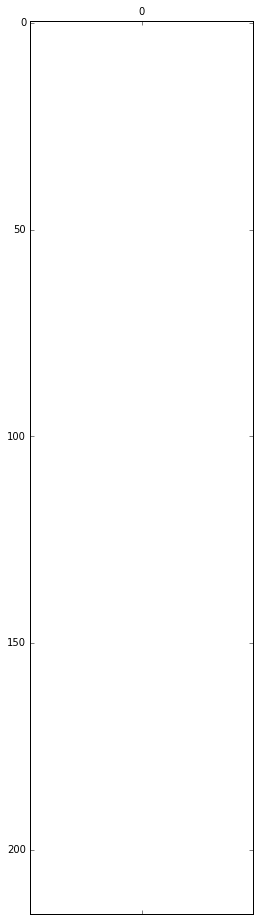

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -4.4848262781370792e-06, 'register': 'left', 'timer': 5, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.4660712487533339e+301, 'check': None}


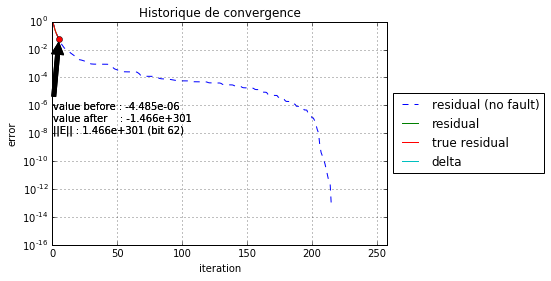

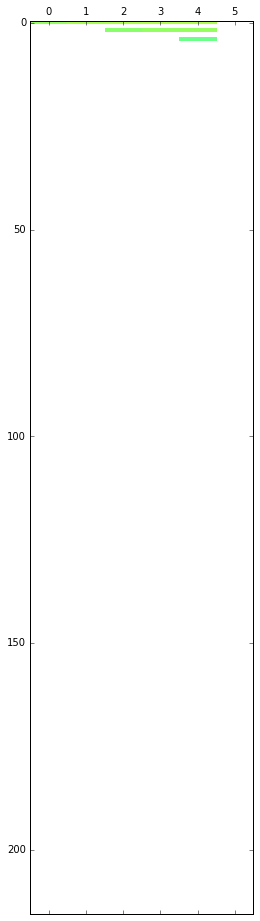

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 4.1196127309758664e-06, 'register': 'left', 'timer': 10, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 4.7997459282532128e+301, 'check': None}


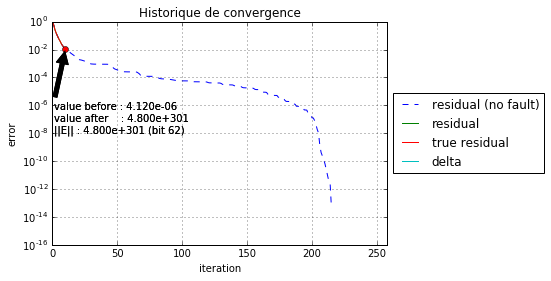

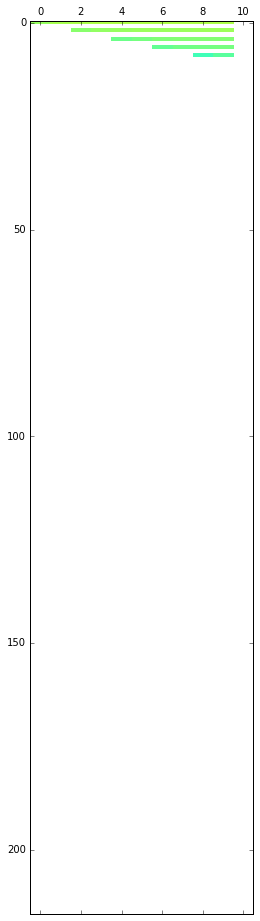

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -5.4629779038800961e-06, 'register': 'left', 'timer': 15, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -4.0797018177810736e+301, 'check': None}


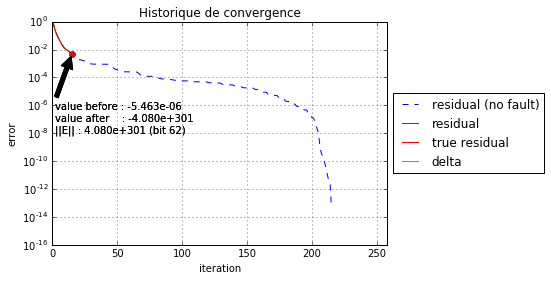

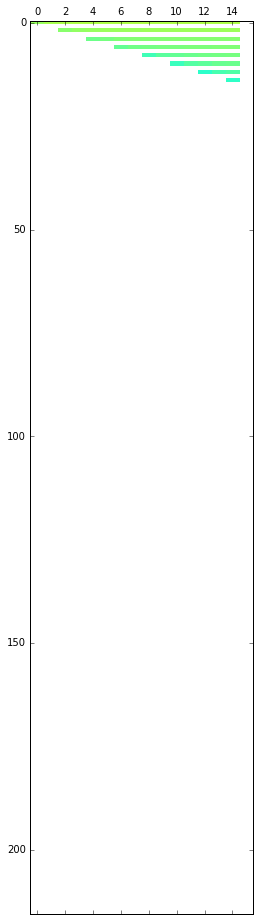

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.190722869807253e-05, 'register': 'left', 'timer': 20, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 4.278830499509567e+301, 'check': None}


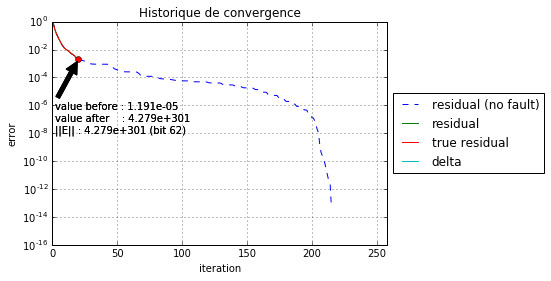

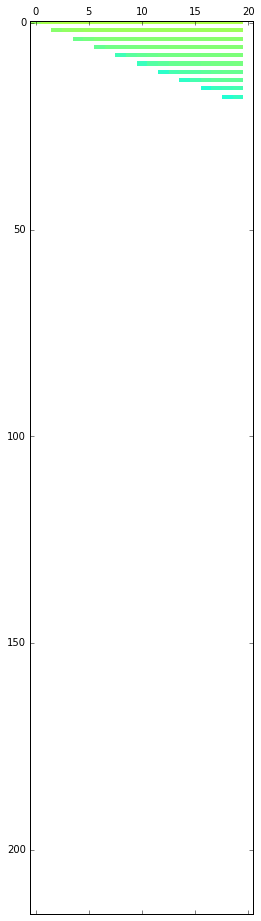

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 2.736860467419547e-05, 'register': 'left', 'timer': 25, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 2.1071157840517478e+301, 'check': None}


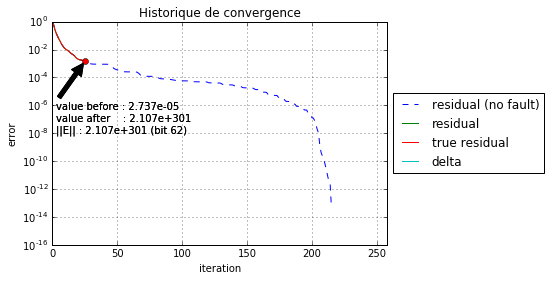

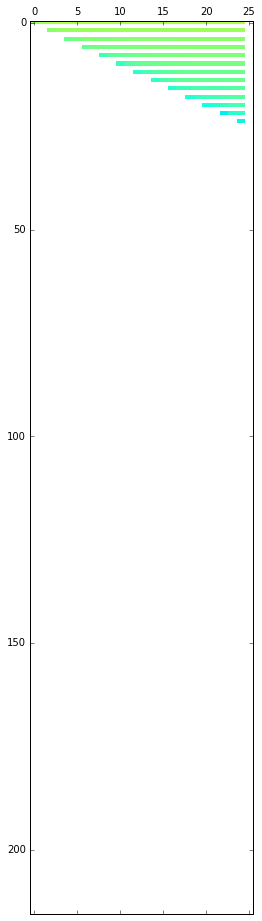

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.8787753012896842e-06, 'register': 'left', 'timer': 30, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -3.834157265220878e+301, 'check': None}


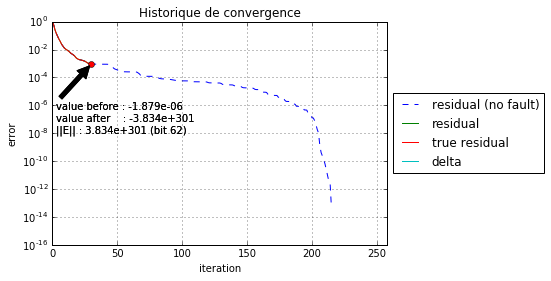

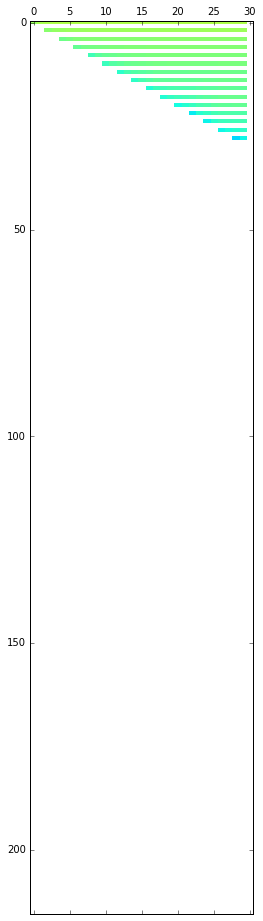

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.4235151424763265e-05, 'register': 'left', 'timer': 35, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.4678710874469773e+301, 'check': None}


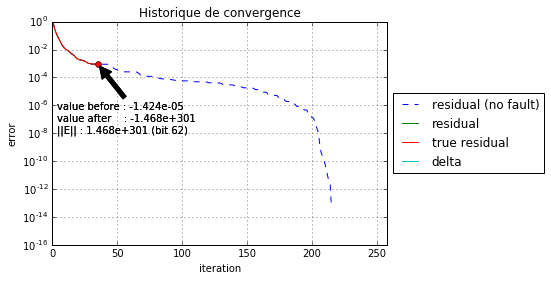

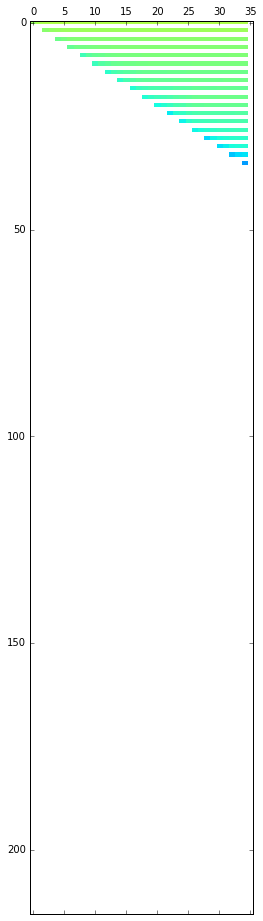

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 7.9925971416764389e-06, 'register': 'left', 'timer': 40, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 2.1984755981855621e+301, 'check': None}


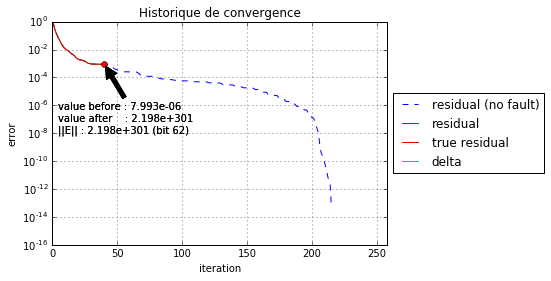

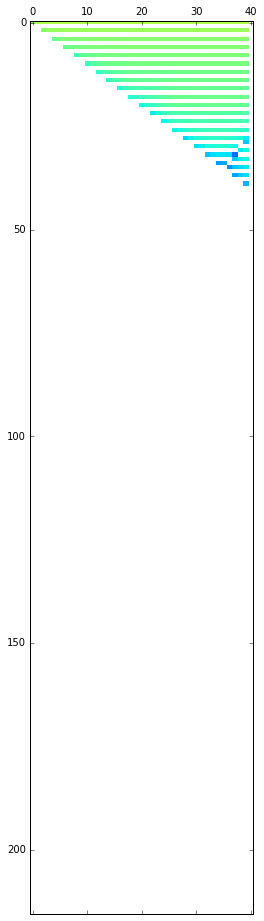

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 2.445495924707248e-05, 'register': 'left', 'timer': 45, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 4.7429285761092923e+301, 'check': None}


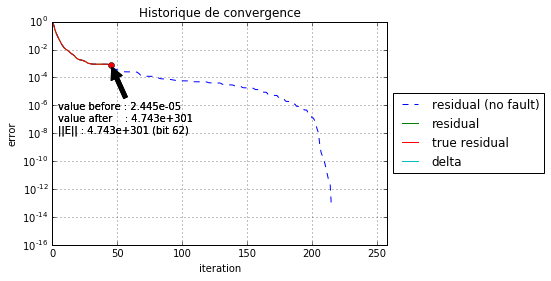

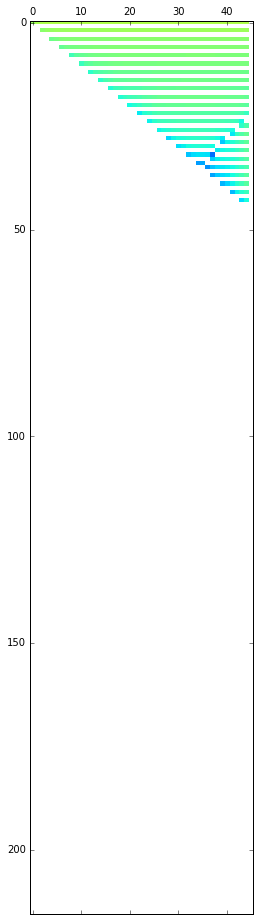

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 9.1985481956891864e-06, 'register': 'left', 'timer': 50, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -6.1576475747468511e+301, 'check': None}


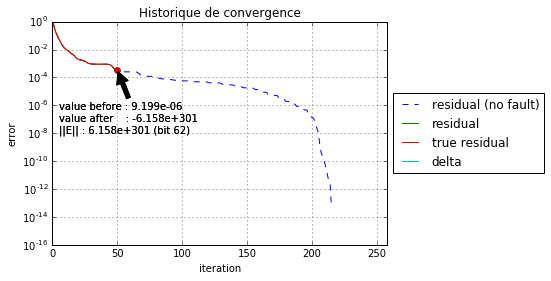

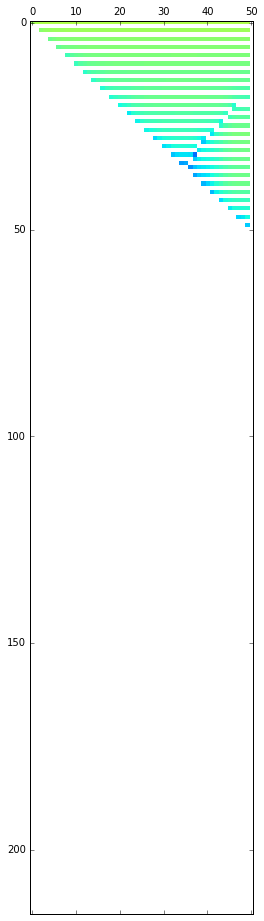

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.8030816712508663e-05, 'register': 'left', 'timer': 55, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -5.412668193488311e+301, 'check': None}


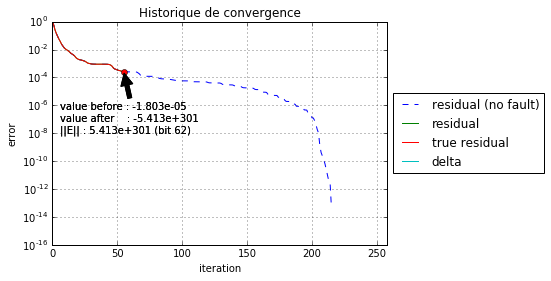

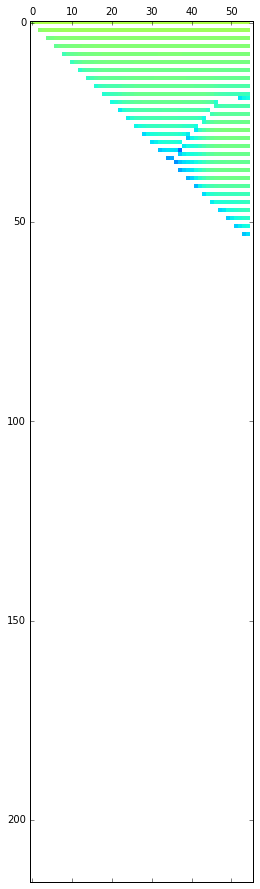

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -7.1545518121320594e-06, 'register': 'left', 'timer': 60, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.1713210871689069e+302, 'check': None}


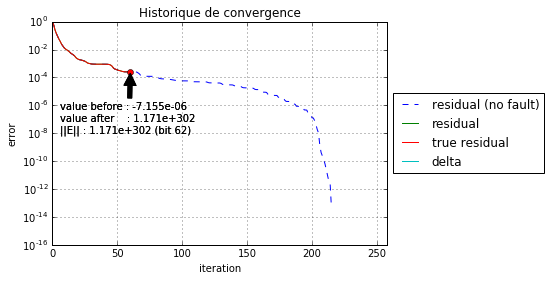

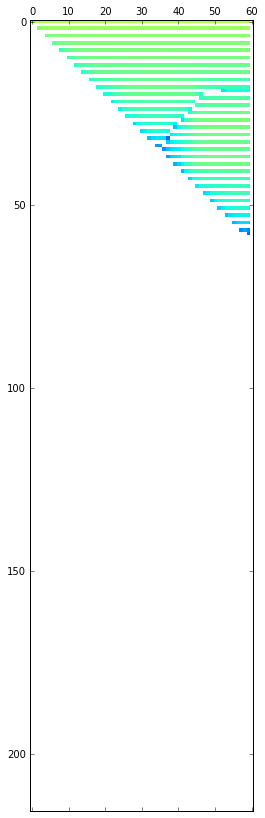

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.1166229194627638e-05, 'register': 'left', 'timer': 65, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.9080081606438095e+300, 'check': None}


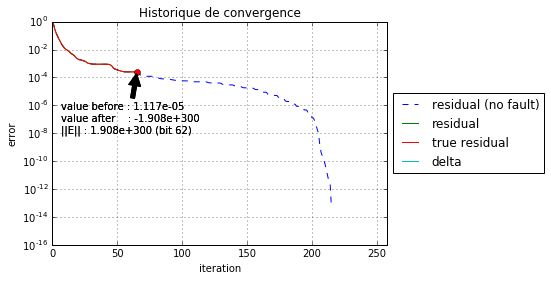

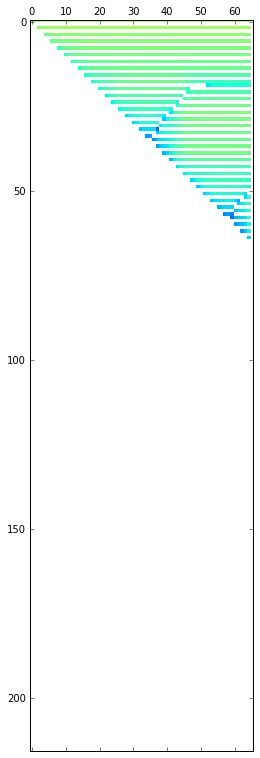

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -4.4448647000017346e-06, 'register': 'left', 'timer': 70, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.5730960137227619e+301, 'check': None}


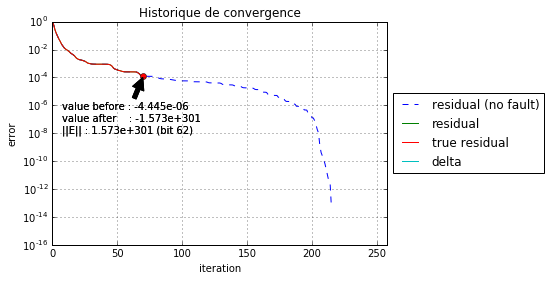

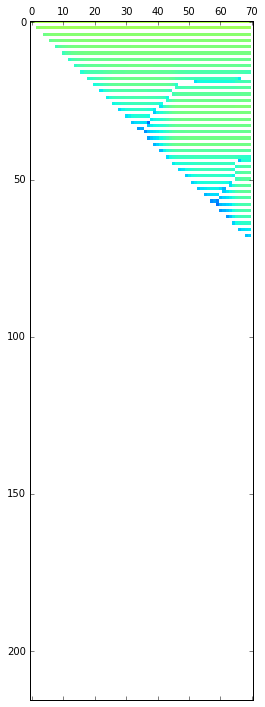

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 7.2008219550188734e-07, 'register': 'left', 'timer': 75, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -4.1668610475612531e+301, 'check': None}


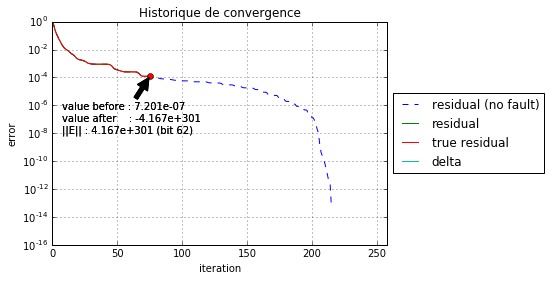

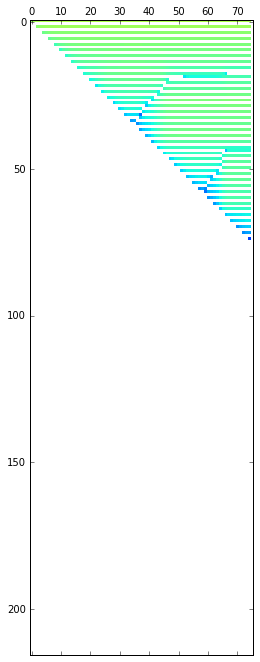

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 2.5374247936896032e-05, 'register': 'left', 'timer': 80, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 2.8816201675257879e+300, 'check': None}


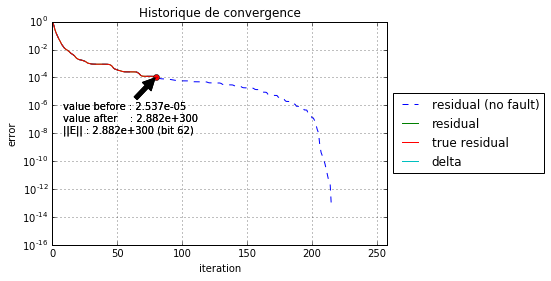

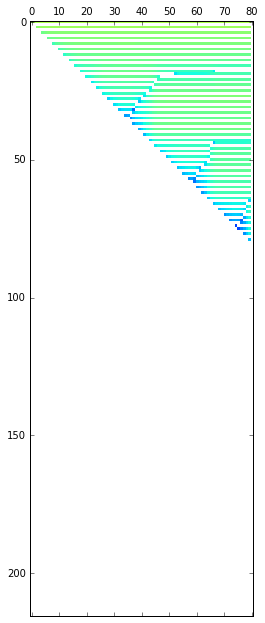

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.7474520536681822e-05, 'register': 'left', 'timer': 85, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 3.4083200197852227e+300, 'check': None}


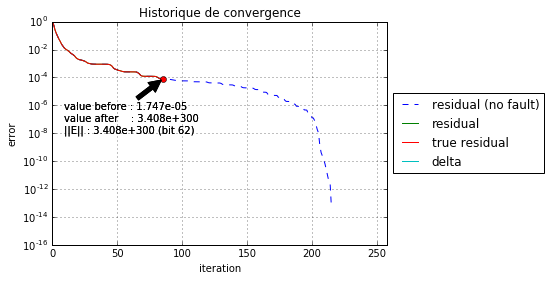

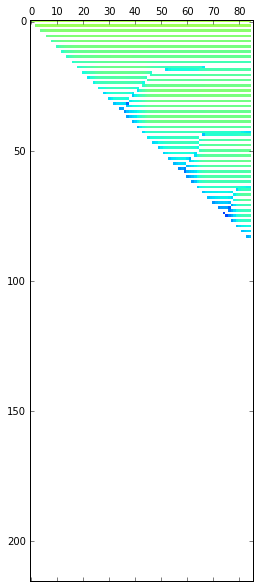

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.2691020366717581e-06, 'register': 'left', 'timer': 90, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 4.1885456004815653e+300, 'check': None}


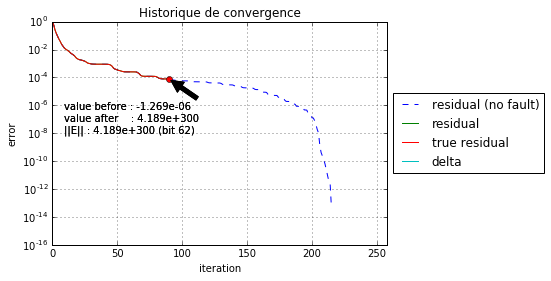

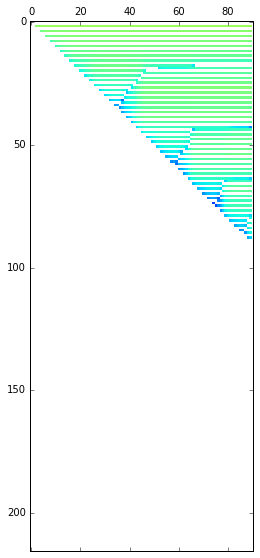

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -3.3123068081539234e-05, 'register': 'left', 'timer': 95, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.7559644273329213e+301, 'check': None}


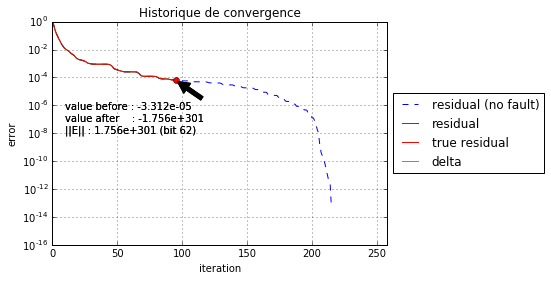

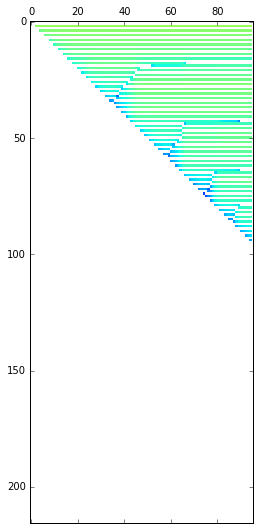

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.3237668179904697e-05, 'register': 'left', 'timer': 100, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.2599364897451159e+301, 'check': None}


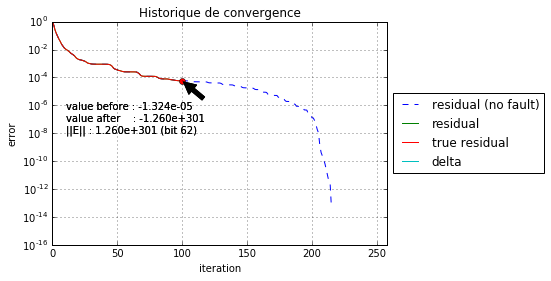

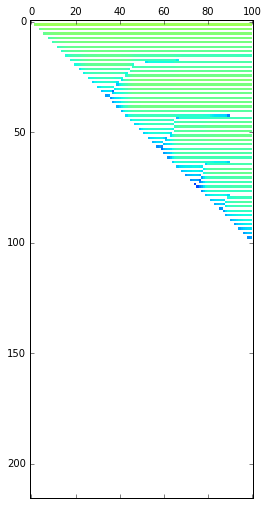

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -2.9761458074618695e-05, 'register': 'left', 'timer': 105, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 3.4206655662639274e+301, 'check': None}


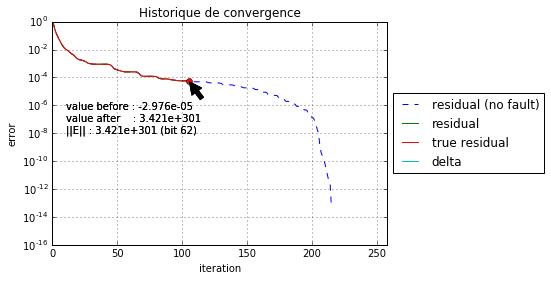

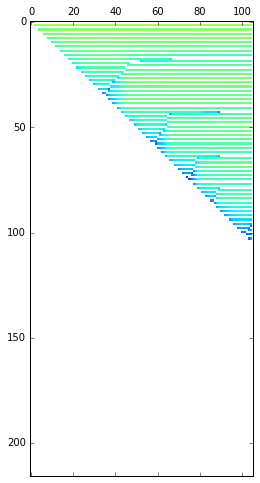

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.3383572765125004e-05, 'register': 'left', 'timer': 110, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.0581212615340673e+301, 'check': None}


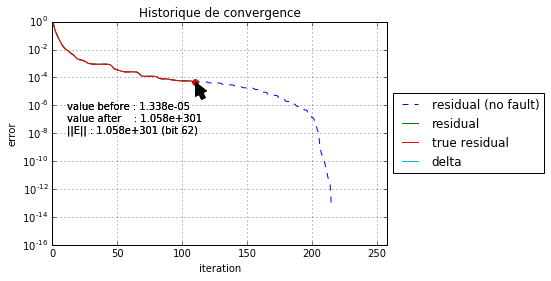

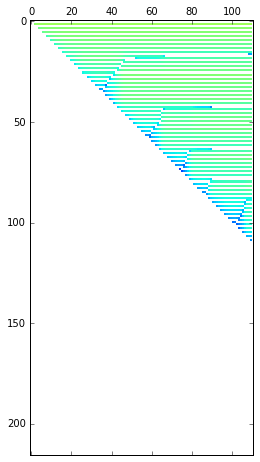

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.1055215124935742e-05, 'register': 'left', 'timer': 115, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.1187198134207785e+302, 'check': None}


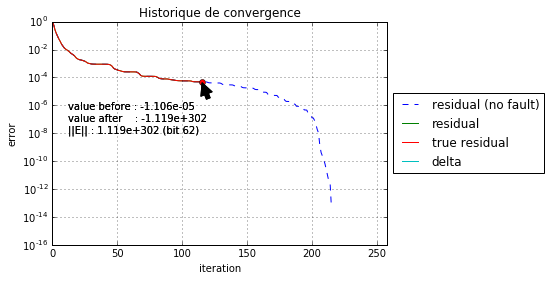

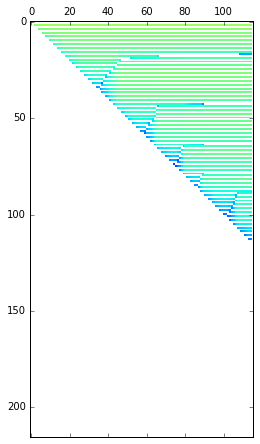

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -5.4632414223932733e-06, 'register': 'left', 'timer': 120, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.2391205704716869e+301, 'check': None}


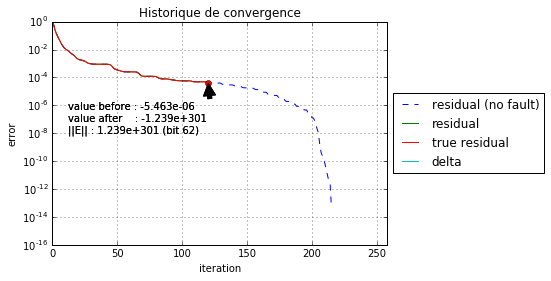

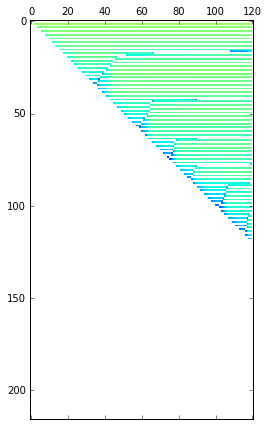

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -2.0442989519275436e-05, 'register': 'left', 'timer': 125, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 4.717335741188799e+301, 'check': None}


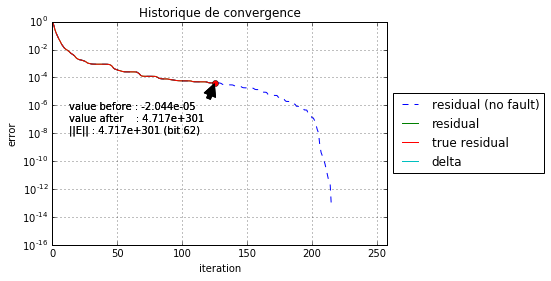

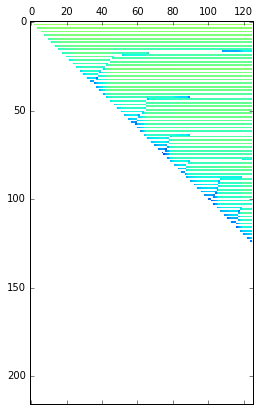

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -9.5915108636876498e-06, 'register': 'left', 'timer': 130, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 7.2695897635229751e+300, 'check': None}


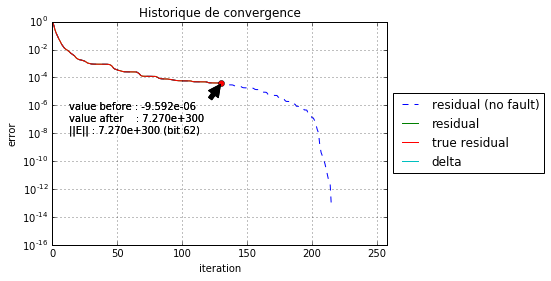

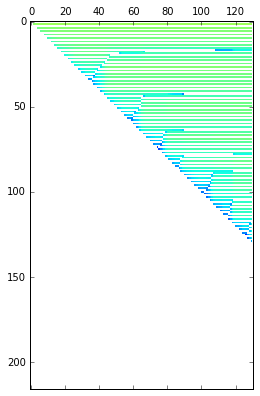

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 8.4584706177743762e-06, 'register': 'left', 'timer': 135, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -3.4252284089585615e+300, 'check': None}


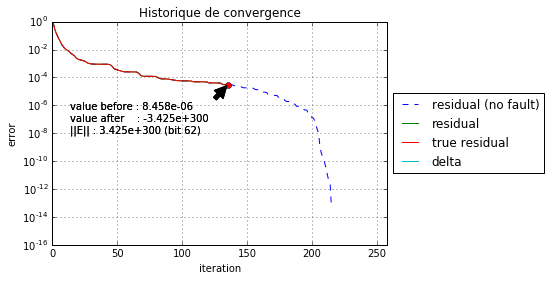

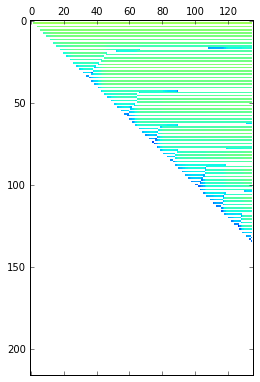

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 7.5181776030321123e-06, 'register': 'left', 'timer': 140, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -2.9187902546688211e+300, 'check': None}


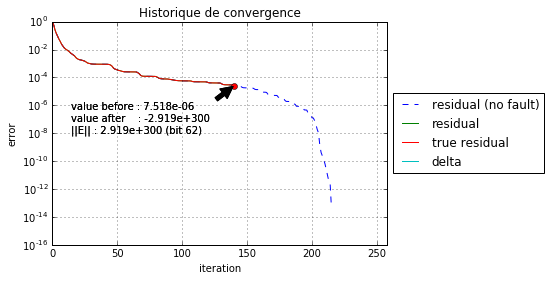

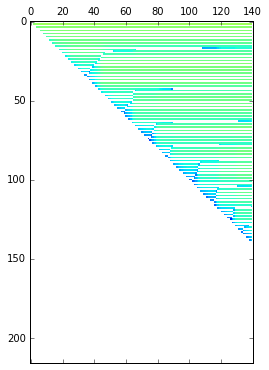

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.1432488106259526e-05, 'register': 'left', 'timer': 145, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 7.4836405670482342e+300, 'check': None}


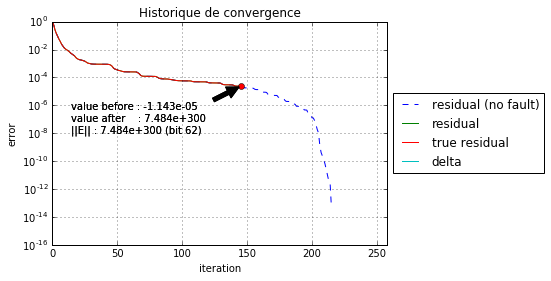

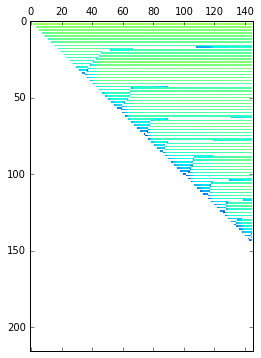

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -1.4246617301028755e-07, 'register': 'left', 'timer': 150, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 2.7645286346474484e+301, 'check': None}


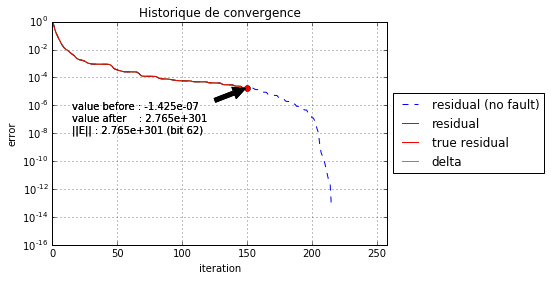

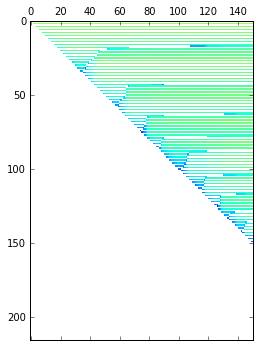

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -9.14874424114741e-06, 'register': 'left', 'timer': 155, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 9.0607945164012299e+300, 'check': None}


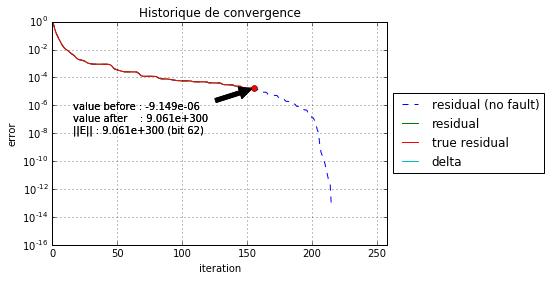

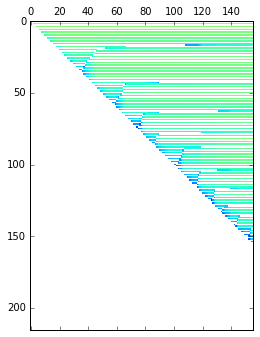

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -7.9930025084224684e-06, 'register': 'left', 'timer': 160, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.9933516780047842e+300, 'check': None}


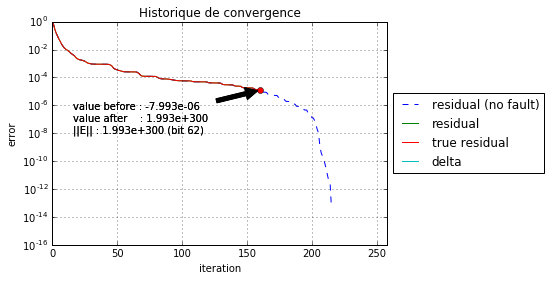

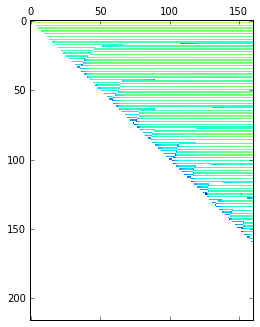

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 5.0510963820055909e-06, 'register': 'left', 'timer': 165, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -5.1033853012097125e+300, 'check': None}


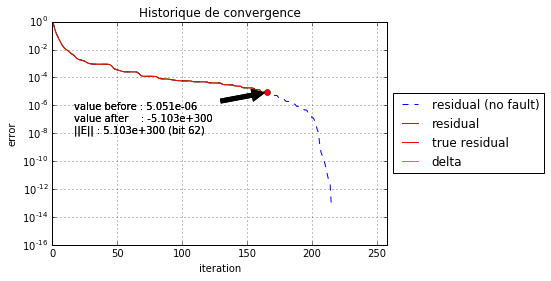

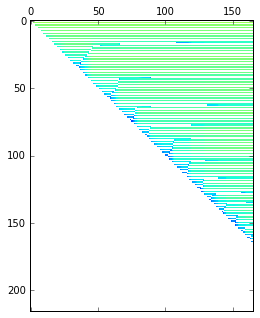

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.1978090643338028e-05, 'register': 'left', 'timer': 170, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.6425596998439964e+301, 'check': None}


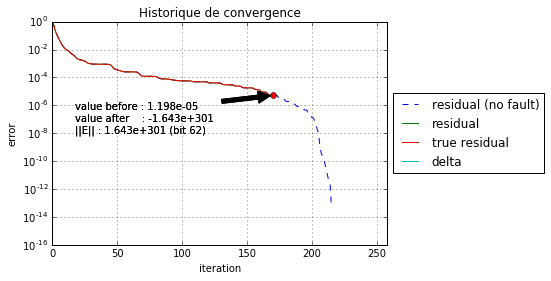

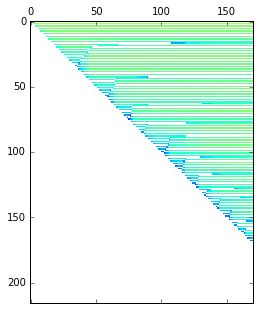

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -8.178081360381179e-06, 'register': 'left', 'timer': 175, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -8.6628882718540932e+299, 'check': None}


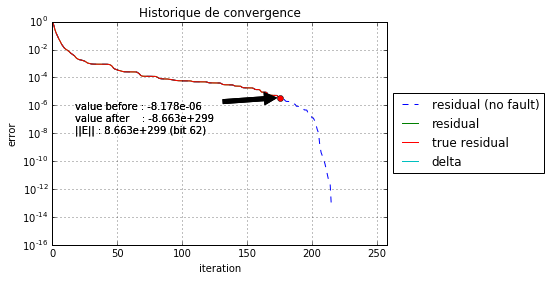

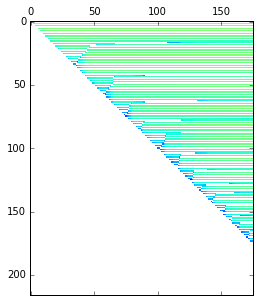

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.682794120524015e-05, 'register': 'left', 'timer': 180, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.6883029043243655e+300, 'check': None}


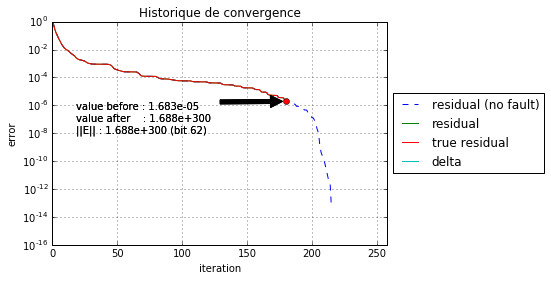

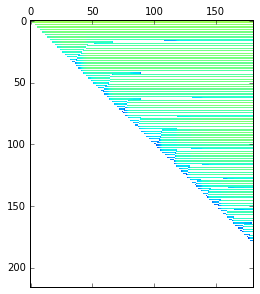

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -3.1079129918340665e-05, 'register': 'left', 'timer': 185, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 3.7633754085948498e+300, 'check': None}


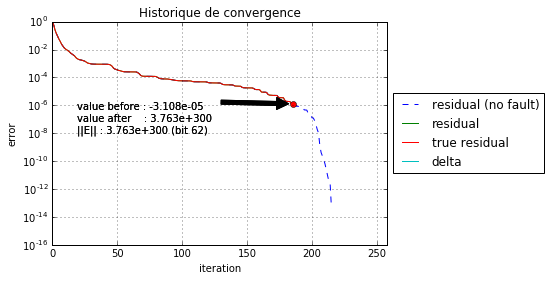

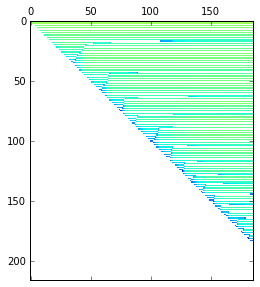

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 6.2767388760891254e-05, 'register': 'left', 'timer': 190, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.9991568452145878e+298, 'check': None}


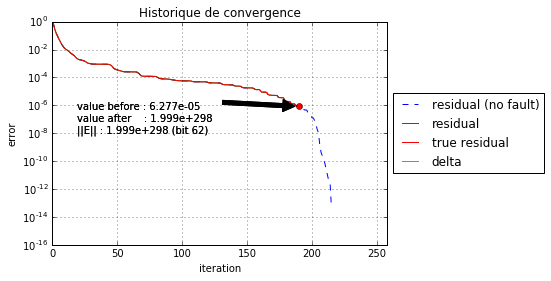

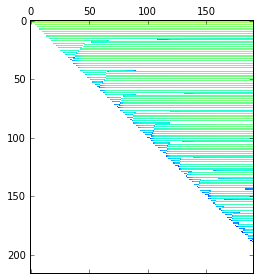

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 2.2032799036049184e-05, 'register': 'left', 'timer': 195, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': -1.6241520594501736e+300, 'check': None}


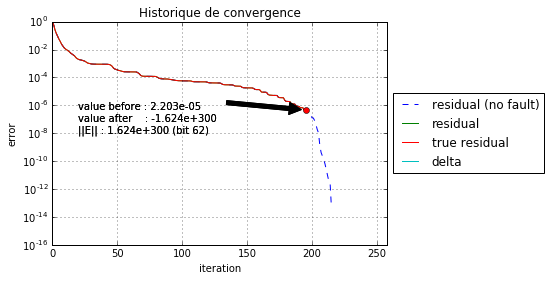

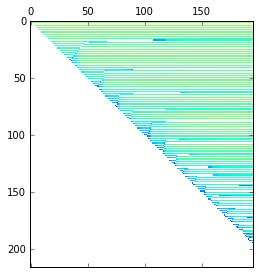

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -6.9392463141439419e-06, 'register': 'left', 'timer': 200, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 8.5756029152015811e+299, 'check': None}


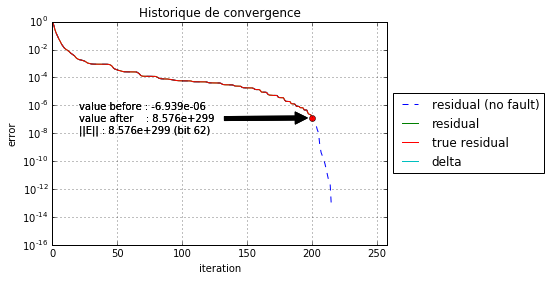

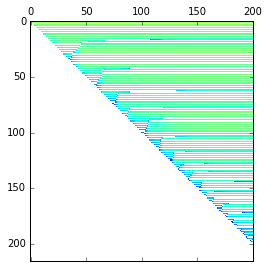

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': 1.2347069164625379e-06, 'register': 'left', 'timer': 205, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 1.8586604884991032e+299, 'check': None}


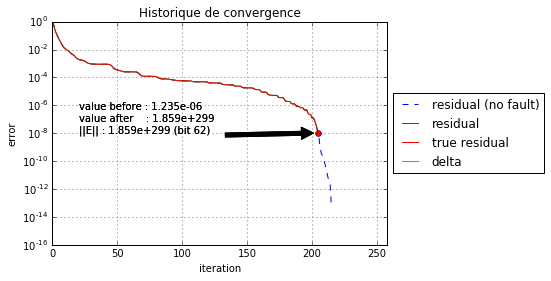

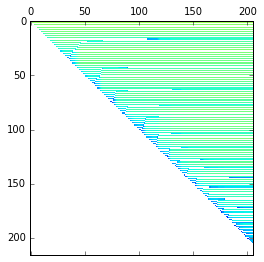

animation
{'register_before': 2.9952199407245901e-06, 'loc': {'i': 195, 'k': 187, 'j': 0}, 'value_before': -3.9219469755674275e-07, 'register': 'left', 'timer': 210, 'register_after': 5.3844863248433085e+302, 'bit': 62, 'value_after': 3.6142449706079194e+299, 'check': None}


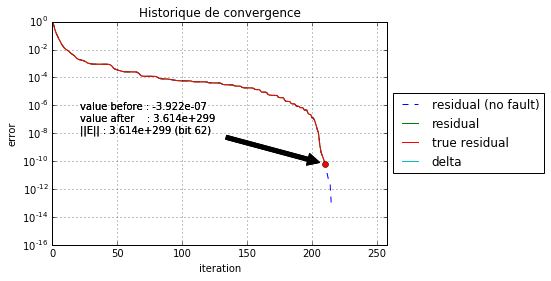

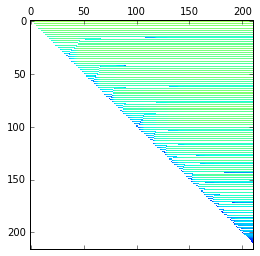

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00056807663309566795, 'register': 'left', 'timer': 0, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00056807663309566795, 'check': True}


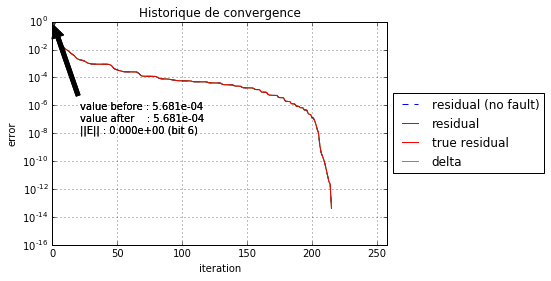

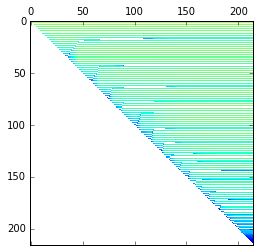

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00022527768322721535, 'register': 'left', 'timer': 5, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00022527768322721535, 'check': True}


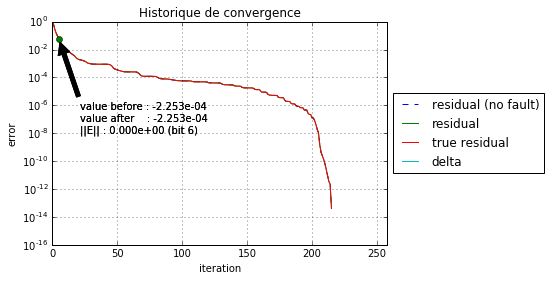

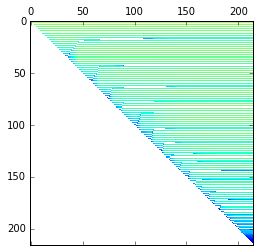

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 5.918367253090961e-05, 'register': 'left', 'timer': 10, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 5.918367253090961e-05, 'check': True}


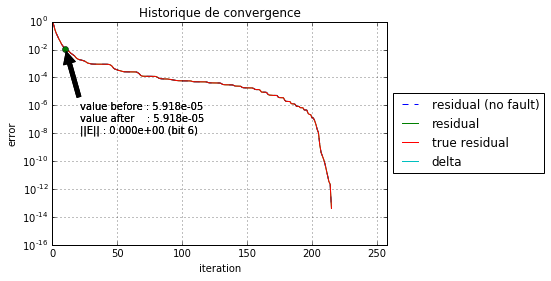

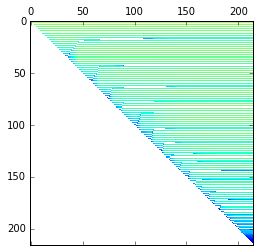

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00019394350800619434, 'register': 'left', 'timer': 15, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00019394350800619434, 'check': True}


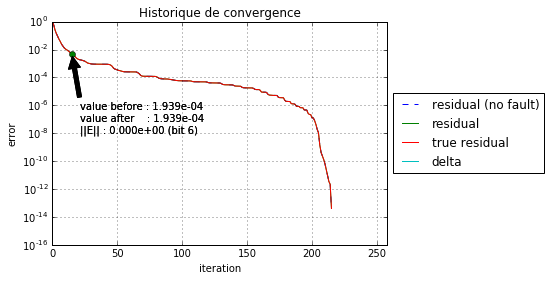

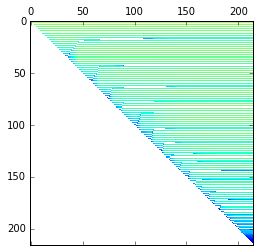

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00010717250492139198, 'register': 'left', 'timer': 20, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00010717250492139198, 'check': True}


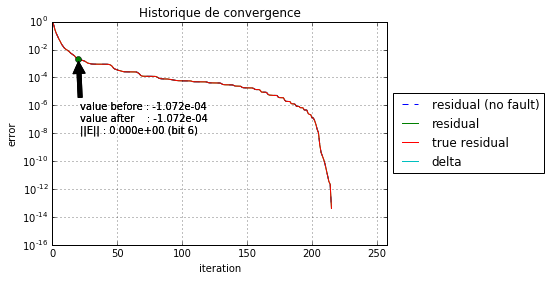

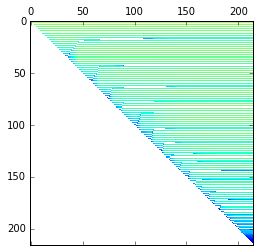

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00015370591837149782, 'register': 'left', 'timer': 25, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00015370591837149782, 'check': True}


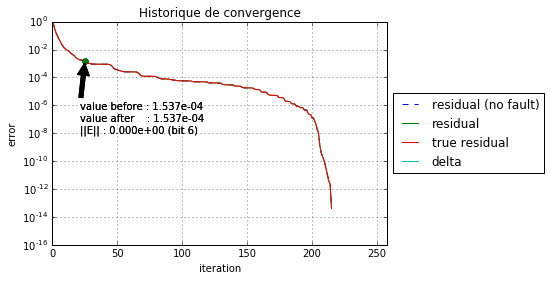

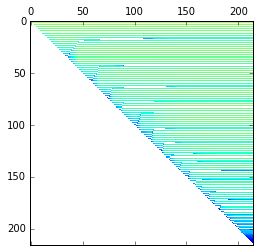

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00011671765234249503, 'register': 'left', 'timer': 30, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00011671765234249503, 'check': True}


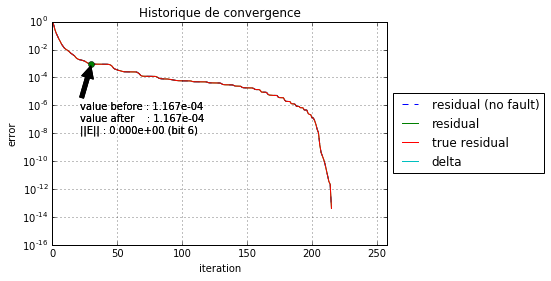

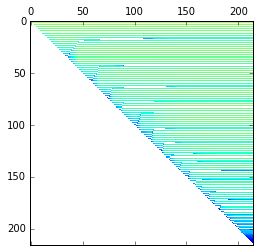

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 7.6387062031062076e-05, 'register': 'left', 'timer': 35, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 7.6387062031062076e-05, 'check': True}


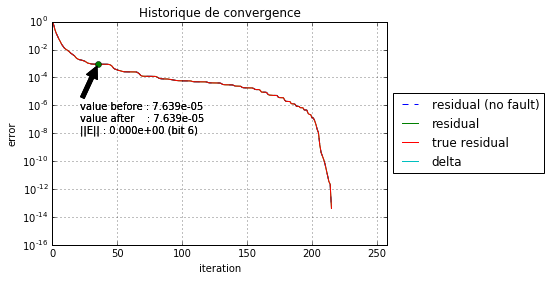

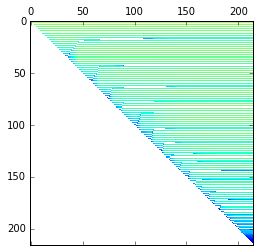

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 7.7477594153739531e-05, 'register': 'left', 'timer': 40, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 7.7477594153739531e-05, 'check': True}


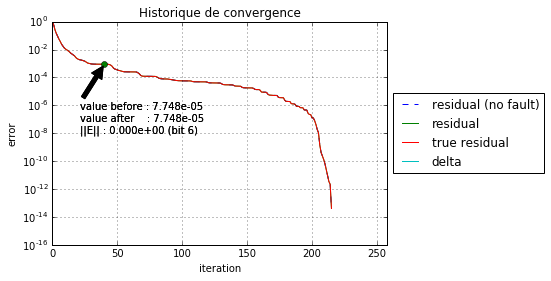

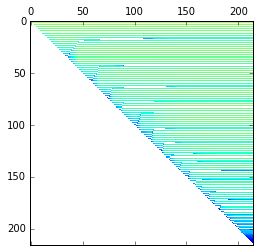

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -8.0971170548610534e-05, 'register': 'left', 'timer': 45, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -8.0971170548610534e-05, 'check': True}


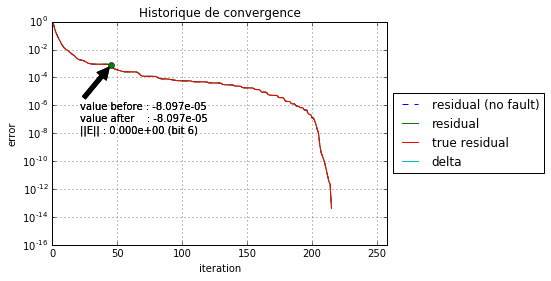

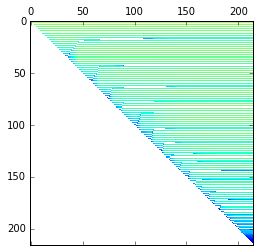

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.0001167016960468972, 'register': 'left', 'timer': 50, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.0001167016960468972, 'check': True}


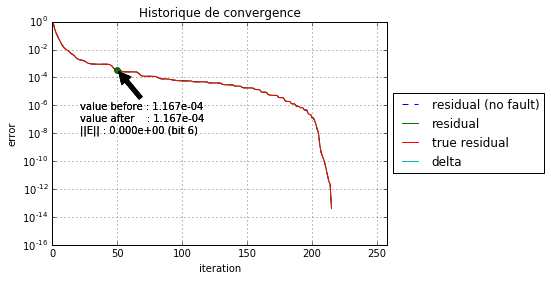

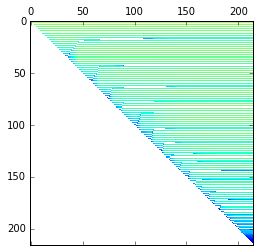

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -9.4316058007860542e-05, 'register': 'left', 'timer': 55, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -9.4316058007860542e-05, 'check': True}


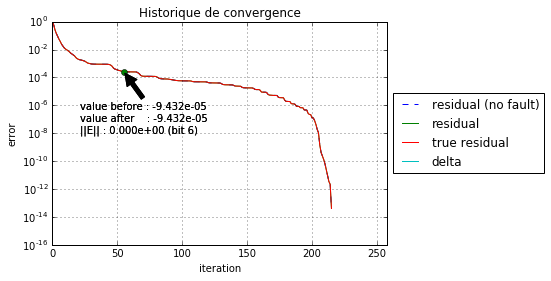

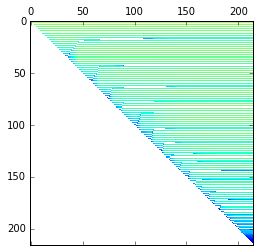

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 5.4832439271496835e-05, 'register': 'left', 'timer': 60, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 5.4832439271496835e-05, 'check': True}


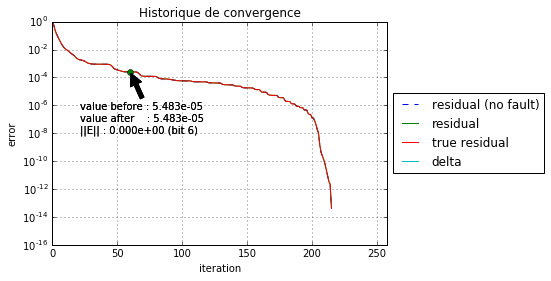

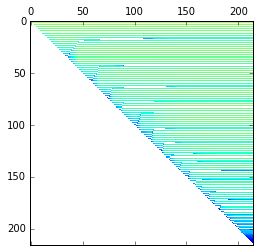

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00015976367271216434, 'register': 'left', 'timer': 65, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00015976367271216434, 'check': True}


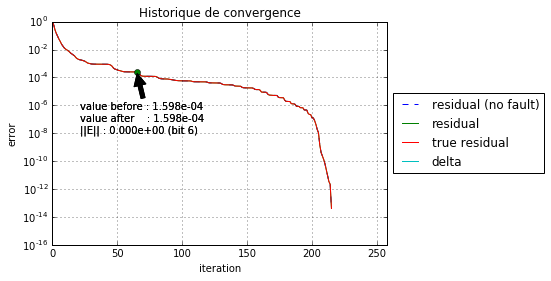

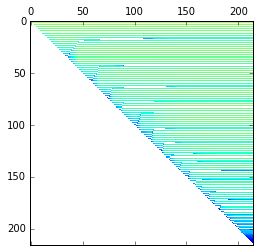

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 2.9246719391638939e-05, 'register': 'left', 'timer': 70, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 2.9246719391638939e-05, 'check': True}


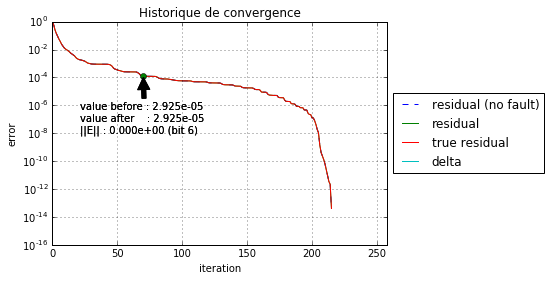

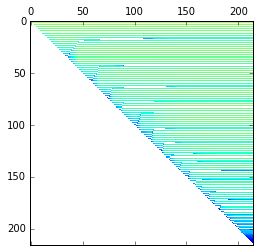

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 6.7406468342039546e-05, 'register': 'left', 'timer': 75, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 6.7406468342039546e-05, 'check': True}


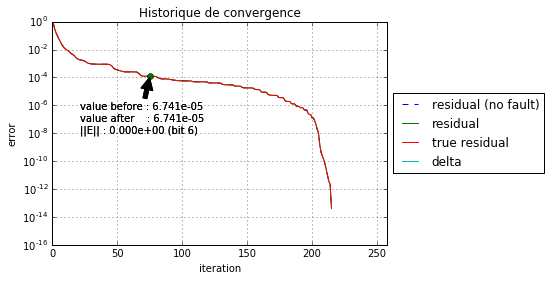

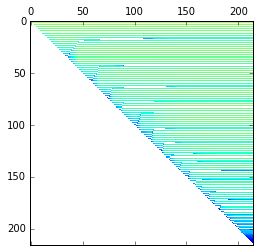

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 2.6688465780489789e-05, 'register': 'left', 'timer': 80, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 2.6688465780489789e-05, 'check': True}


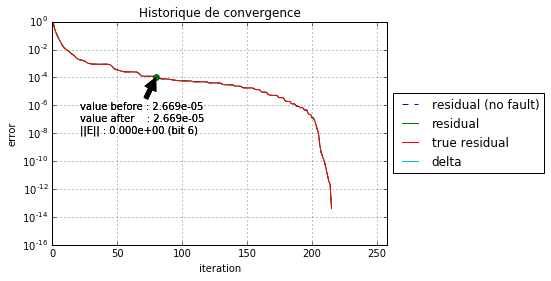

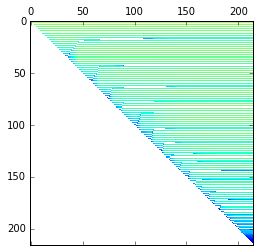

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 4.3782005082977945e-05, 'register': 'left', 'timer': 85, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 4.3782005082977945e-05, 'check': True}


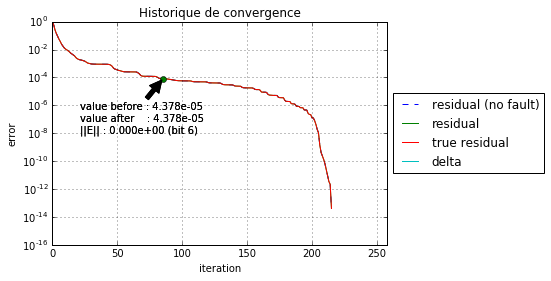

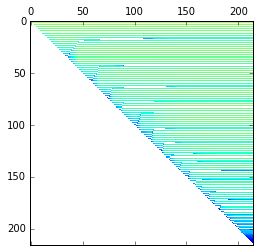

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 6.5525147021749843e-05, 'register': 'left', 'timer': 90, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 6.5525147021749843e-05, 'check': True}


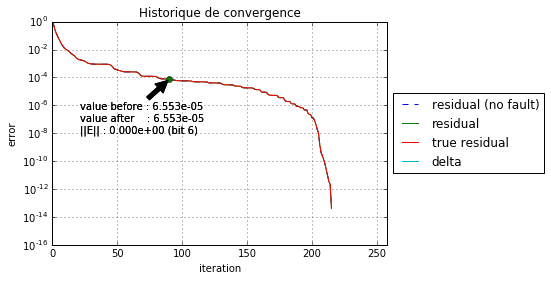

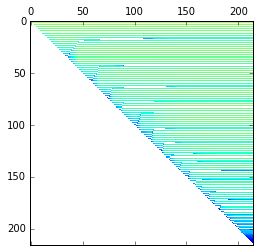

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00010880479488974867, 'register': 'left', 'timer': 95, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00010880479488974867, 'check': True}


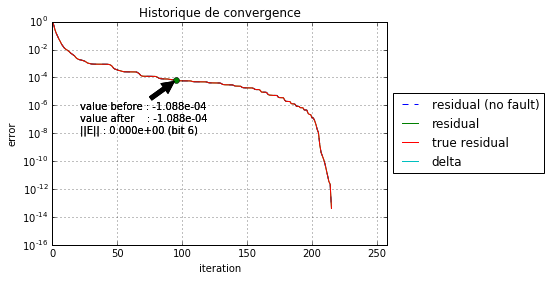

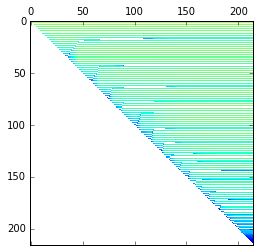

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00011595511363389186, 'register': 'left', 'timer': 100, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00011595511363389186, 'check': True}


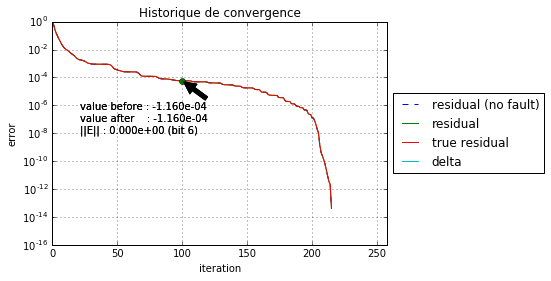

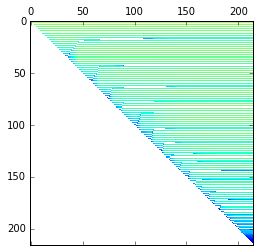

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 3.7569878015910735e-05, 'register': 'left', 'timer': 105, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 3.7569878015910735e-05, 'check': True}


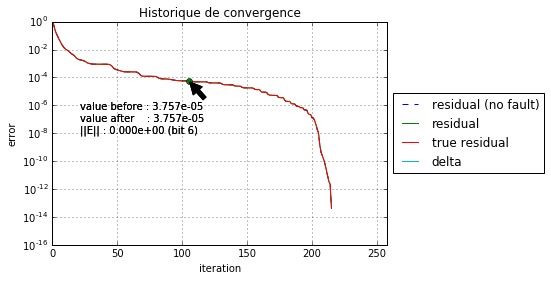

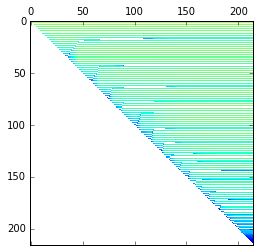

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 8.7018663633322733e-05, 'register': 'left', 'timer': 110, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 8.7018663633322733e-05, 'check': True}


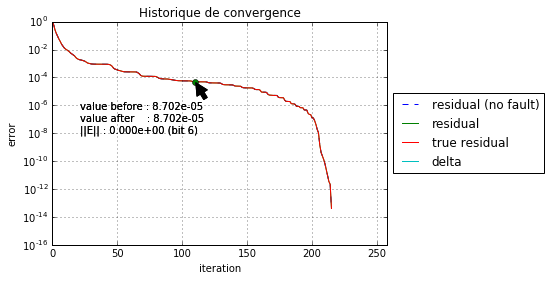

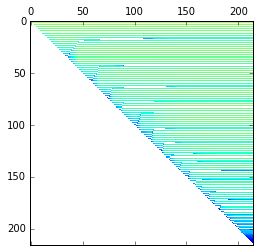

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00017956783176267905, 'register': 'left', 'timer': 115, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00017956783176267905, 'check': True}


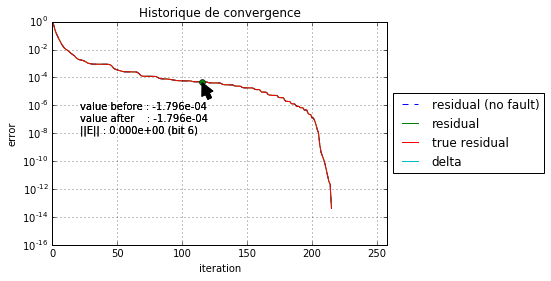

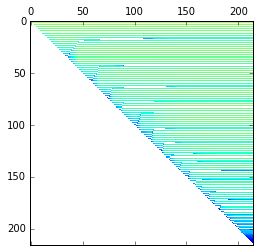

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -1.8171015659368712e-05, 'register': 'left', 'timer': 120, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -1.8171015659368712e-05, 'check': True}


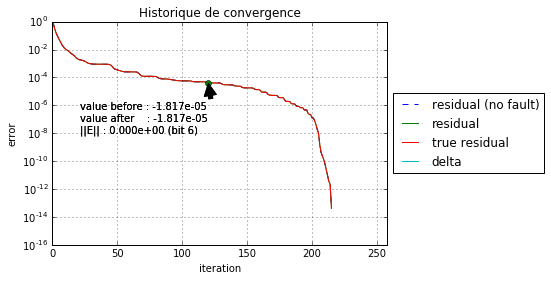

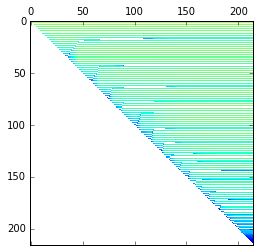

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -1.8466871550091495e-05, 'register': 'left', 'timer': 125, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -1.8466871550091495e-05, 'check': True}


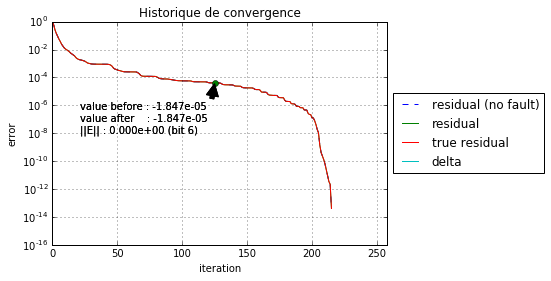

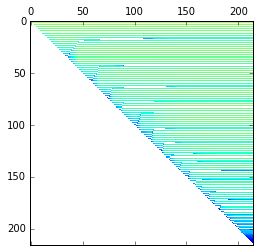

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00014406177640084863, 'register': 'left', 'timer': 130, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00014406177640084863, 'check': True}


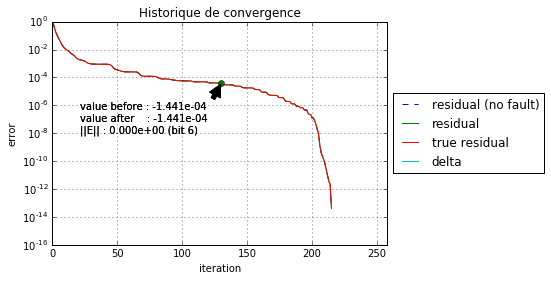

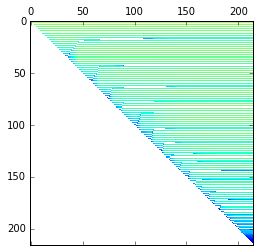

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -2.0883854773747026e-05, 'register': 'left', 'timer': 135, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -2.0883854773747026e-05, 'check': True}


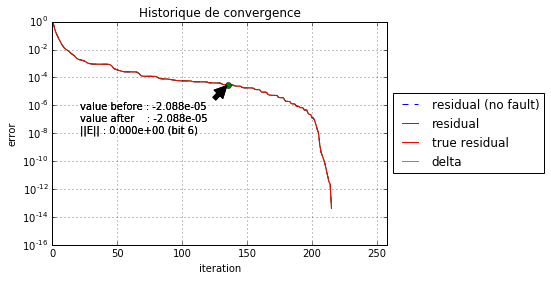

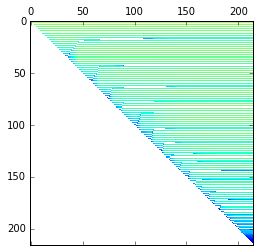

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -4.8008775441771977e-05, 'register': 'left', 'timer': 140, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -4.8008775441771977e-05, 'check': True}


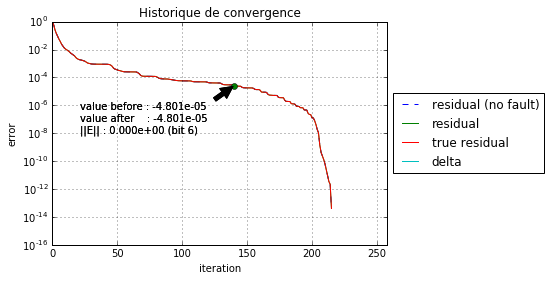

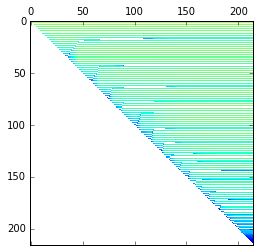

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -8.992781447264546e-06, 'register': 'left', 'timer': 145, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -8.992781447264546e-06, 'check': True}


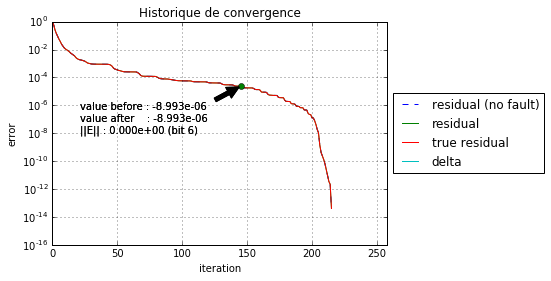

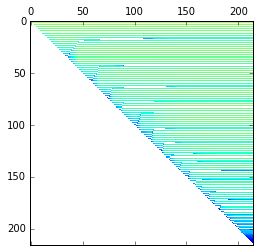

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 1.6071781986691827e-05, 'register': 'left', 'timer': 150, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 1.6071781986691827e-05, 'check': True}


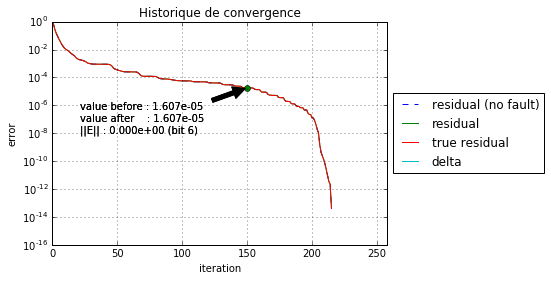

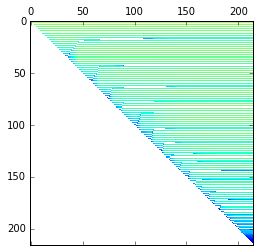

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 2.5826218391855601e-05, 'register': 'left', 'timer': 155, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 2.5826218391855601e-05, 'check': True}


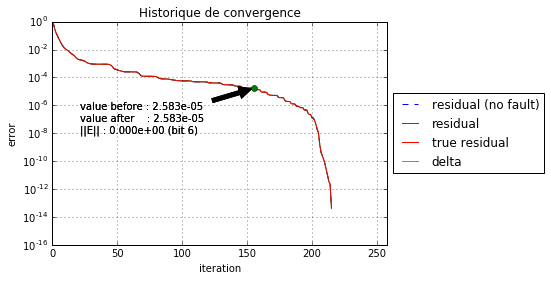

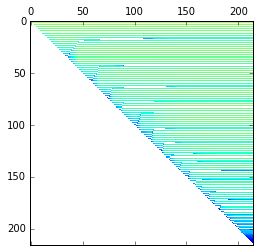

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00014890814367848396, 'register': 'left', 'timer': 160, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00014890814367848396, 'check': True}


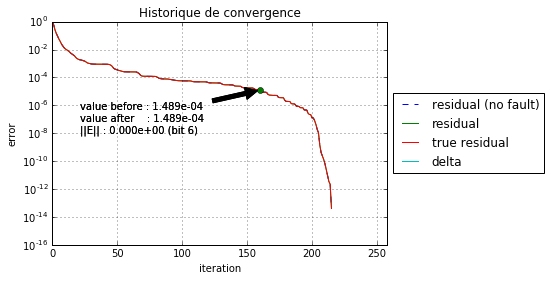

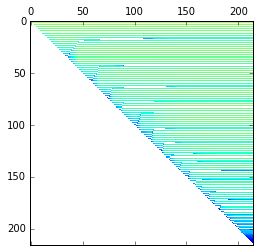

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -2.6694834733337538e-05, 'register': 'left', 'timer': 165, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -2.6694834733337538e-05, 'check': True}


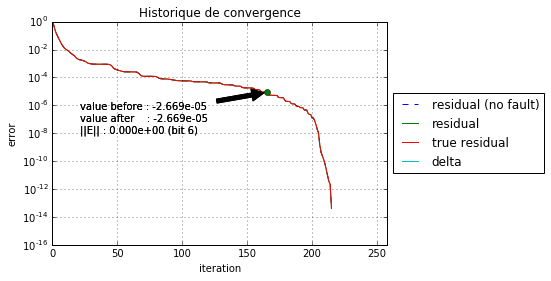

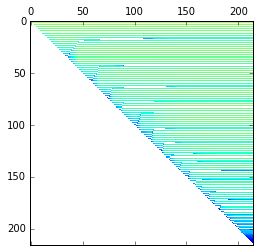

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 1.3887755114743287e-05, 'register': 'left', 'timer': 170, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 1.3887755114743287e-05, 'check': True}


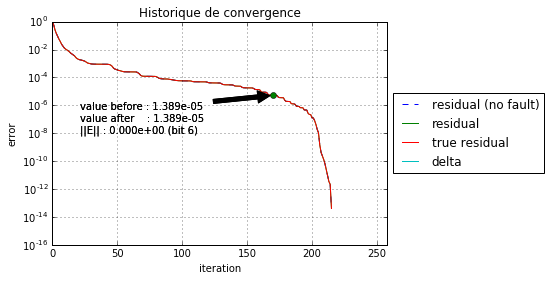

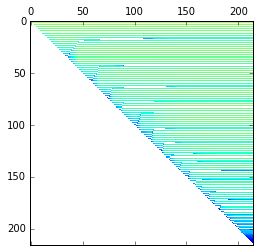

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -6.249028622839955e-05, 'register': 'left', 'timer': 175, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -6.249028622839955e-05, 'check': True}


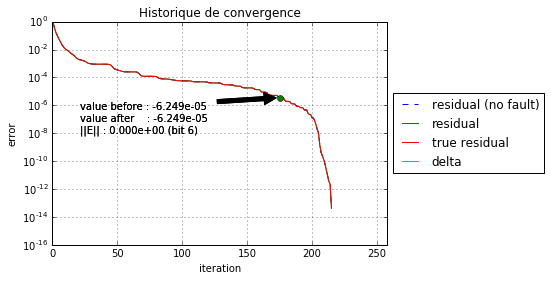

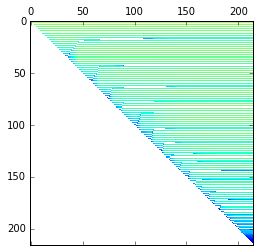

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -4.5770300686857768e-05, 'register': 'left', 'timer': 180, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -4.5770300686857768e-05, 'check': True}


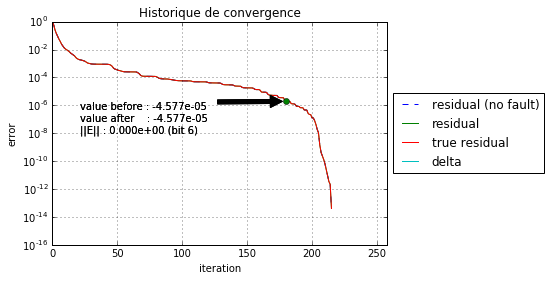

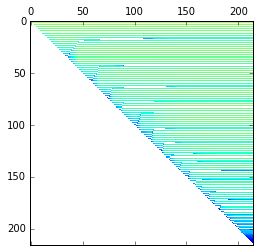

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -0.00011664951041228552, 'register': 'left', 'timer': 185, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -0.00011664951041228552, 'check': True}


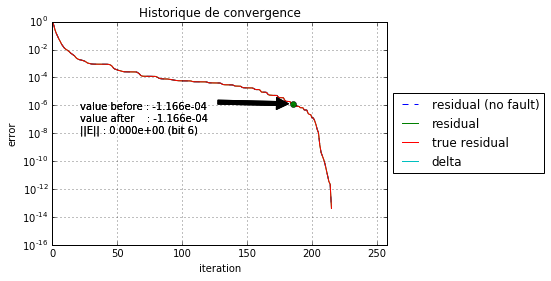

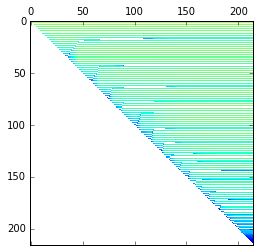

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': 0.00010763904076227615, 'register': 'left', 'timer': 190, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': 0.00010763904076227615, 'check': True}


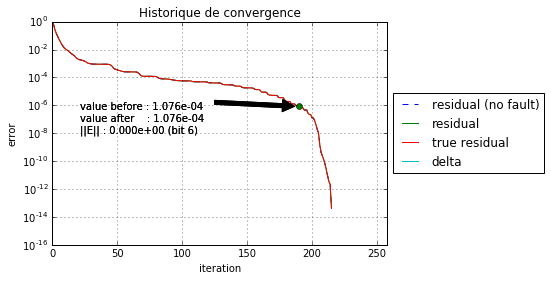

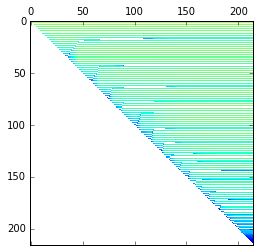

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -4.6357499254866605e-05, 'register': 'left', 'timer': 195, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -4.6357499254866605e-05, 'check': True}


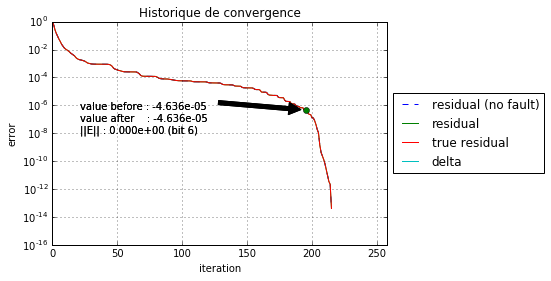

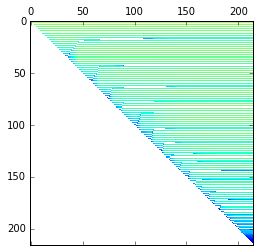

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -1.4341302651523602e-06, 'register': 'left', 'timer': 200, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -1.4341302651523602e-06, 'check': True}


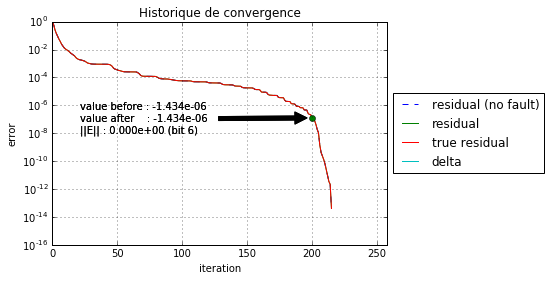

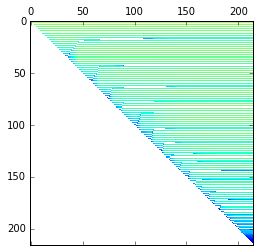

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -1.0931508901327873e-05, 'register': 'left', 'timer': 205, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -1.0931508901327873e-05, 'check': True}


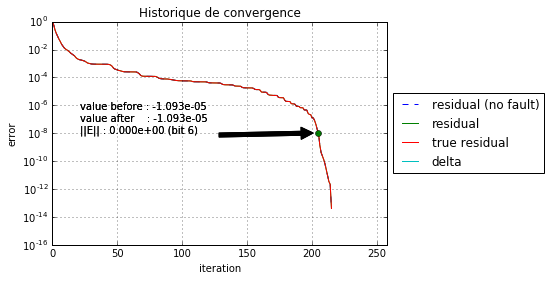

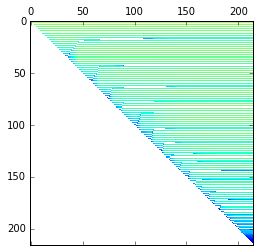

animation
{'register_before': -2.6107588313450999e-18, 'loc': {'i': 58, 'k': 92, 'j': 0}, 'value_before': -7.5888060459721064e-07, 'register': 'left', 'timer': 210, 'register_after': -2.6107588313451245e-18, 'bit': 6, 'value_after': -7.5888060459721064e-07, 'check': True}


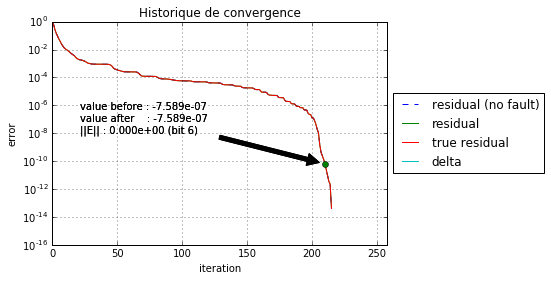

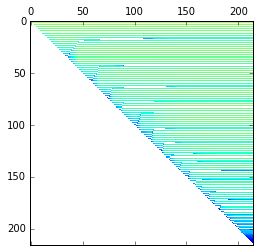

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00049384899308142782, 'register': 'left', 'timer': 0, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00044300137384119536, 'check': None}


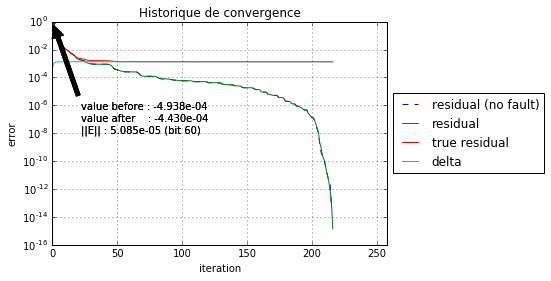

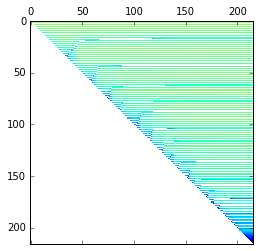

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.00067024419936852241, 'register': 'left', 'timer': 5, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00062018926147842783, 'check': None}


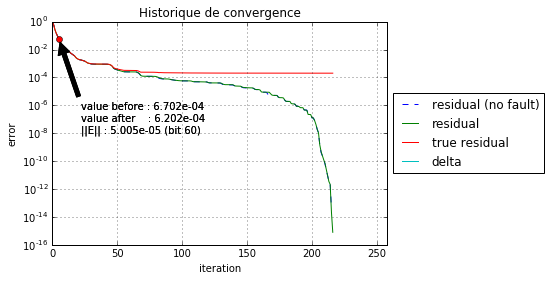

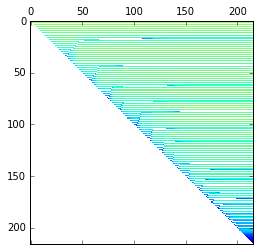

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0034504916292409761, 'register': 'left', 'timer': 10, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0037691160801820709, 'check': None}


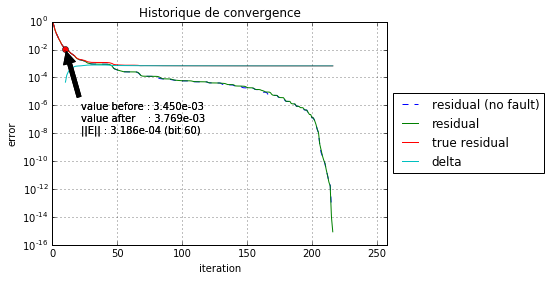

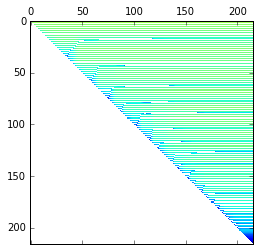

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00051328803401518366, 'register': 'left', 'timer': 15, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00038479237158668244, 'check': None}


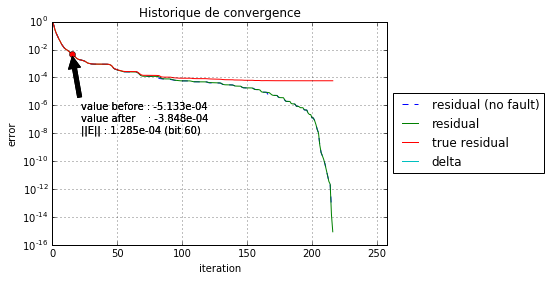

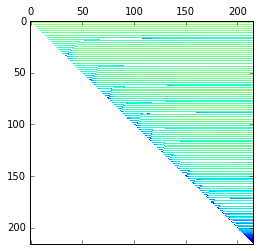

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.00020016250099719004, 'register': 'left', 'timer': 20, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00032847187959031182, 'check': None}


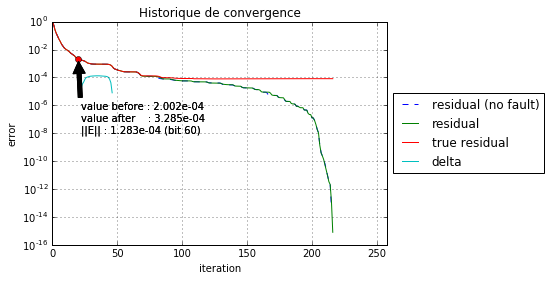

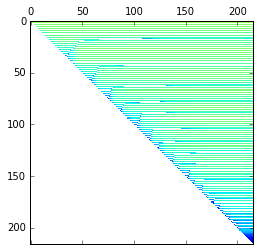

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 1.4478280657401317e-05, 'register': 'left', 'timer': 25, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -6.3350302461022152e-05, 'check': None}


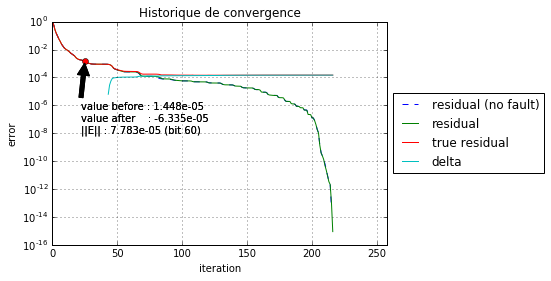

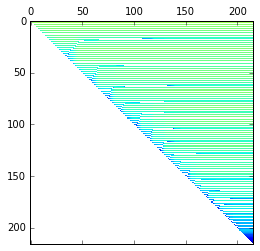

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0020862899026108167, 'register': 'left', 'timer': 30, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.002039240600250708, 'check': None}


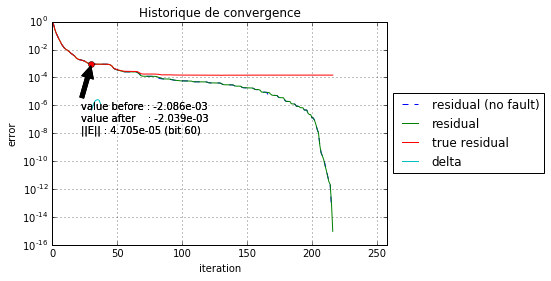

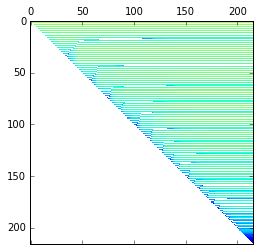

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0024696359813694739, 'register': 'left', 'timer': 35, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0024969576820448609, 'check': None}


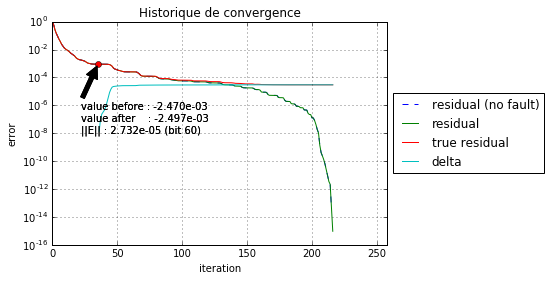

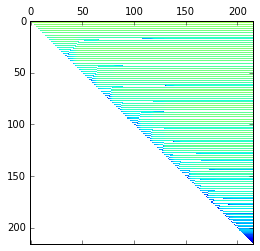

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0012194238461532992, 'register': 'left', 'timer': 40, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0010246577402401888, 'check': None}


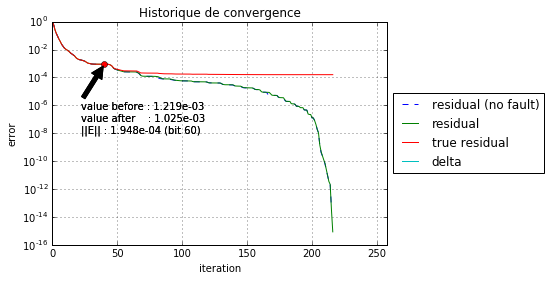

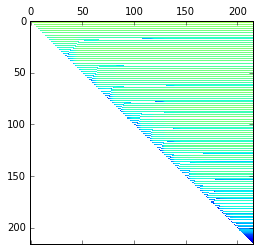

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0019434300001425259, 'register': 'left', 'timer': 45, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0018103237684979829, 'check': None}


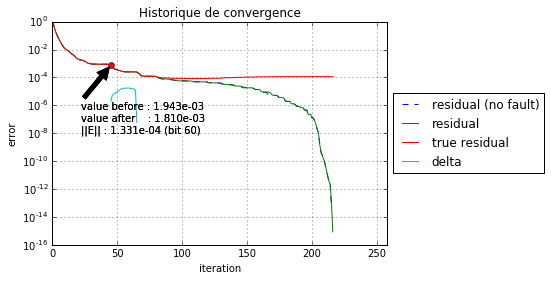

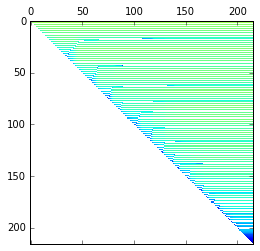

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0024149468199201824, 'register': 'left', 'timer': 50, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0025544710157123078, 'check': None}


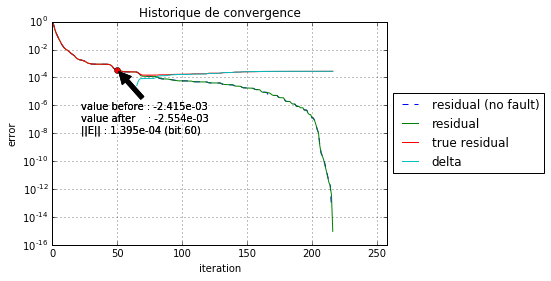

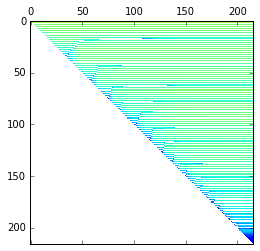

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0010063618731579972, 'register': 'left', 'timer': 55, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00078208984097450241, 'check': None}


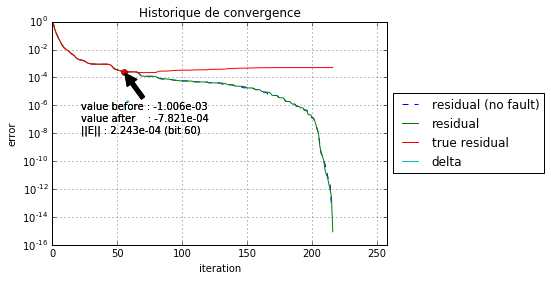

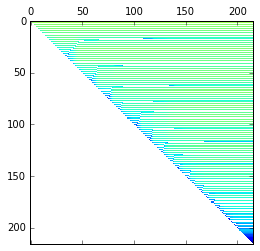

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -9.6785322471894567e-05, 'register': 'left', 'timer': 60, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00013610923694917445, 'check': None}


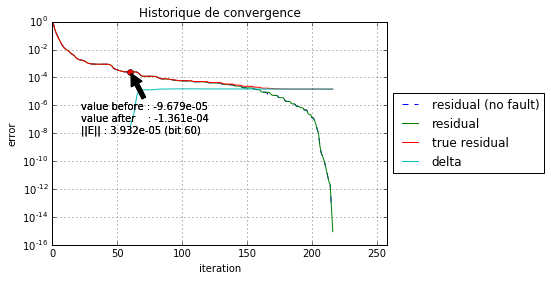

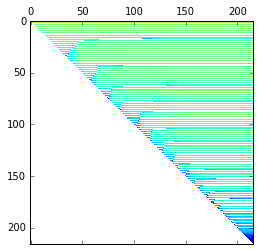

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00079919217332113848, 'register': 'left', 'timer': 65, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00042636303064204394, 'check': None}


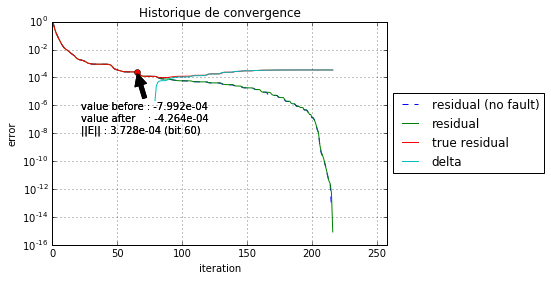

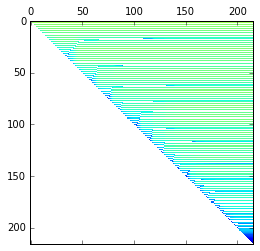

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0012133607708944218, 'register': 'left', 'timer': 70, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0011124719883067184, 'check': None}


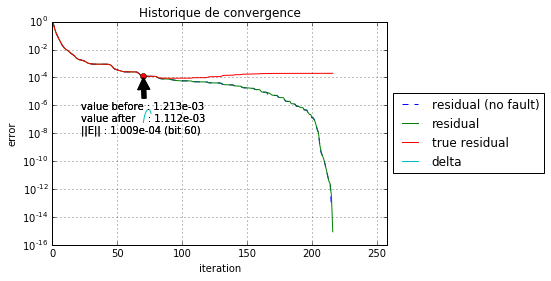

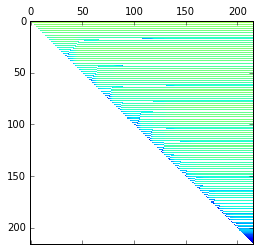

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0010769931581930947, 'register': 'left', 'timer': 75, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0010855587192680513, 'check': None}


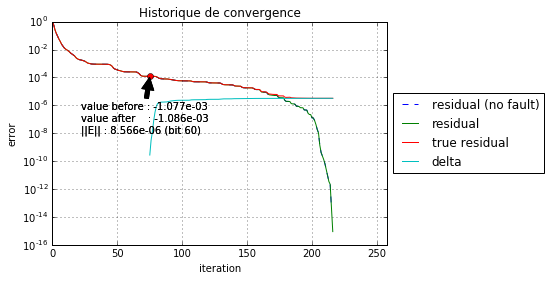

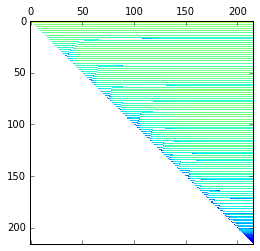

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0044961035135417425, 'register': 'left', 'timer': 80, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0041674580593323565, 'check': None}


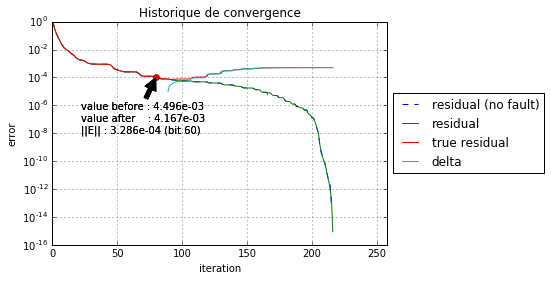

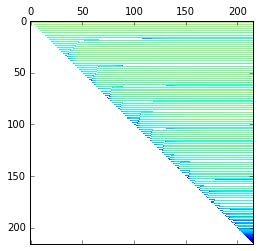

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0057826420031581397, 'register': 'left', 'timer': 85, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0058175617195198367, 'check': None}


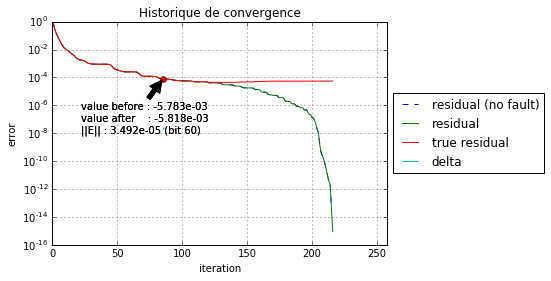

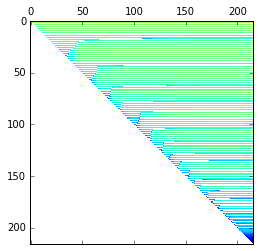

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00082494235300094407, 'register': 'left', 'timer': 90, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00057396155165108679, 'check': None}


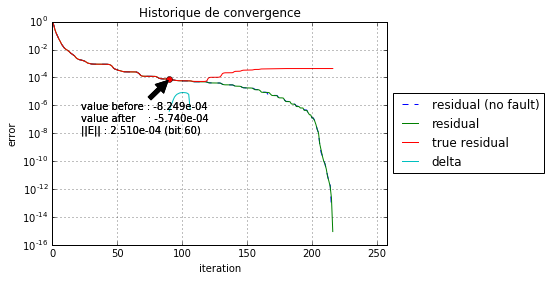

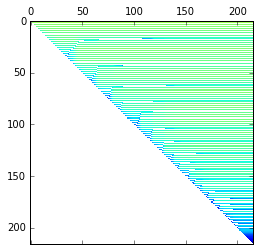

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00077794671066133366, 'register': 'left', 'timer': 95, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00074087854285471131, 'check': None}


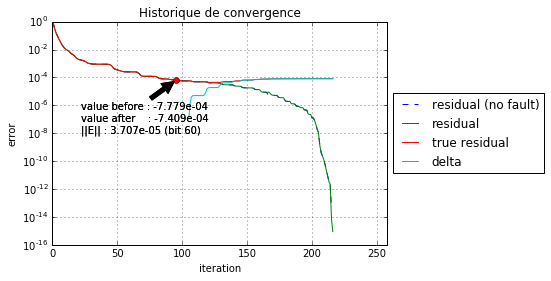

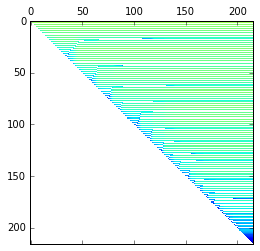

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0010866790932196851, 'register': 'left', 'timer': 100, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00099882644254510426, 'check': None}


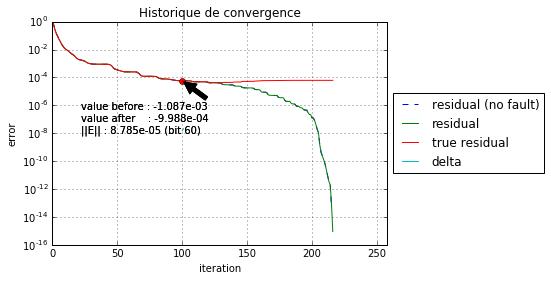

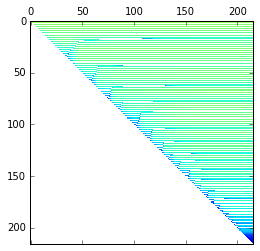

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.00083433635572123944, 'register': 'left', 'timer': 105, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00068469420357512281, 'check': None}


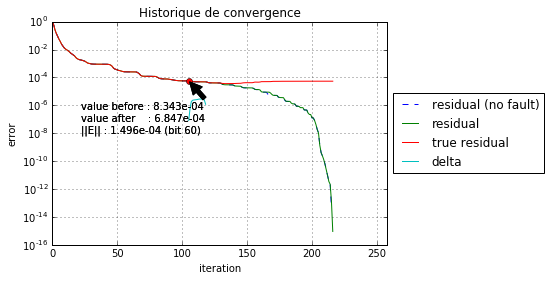

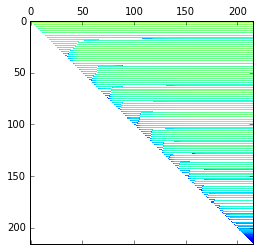

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0014676926023833531, 'register': 'left', 'timer': 110, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0014405840033698475, 'check': None}


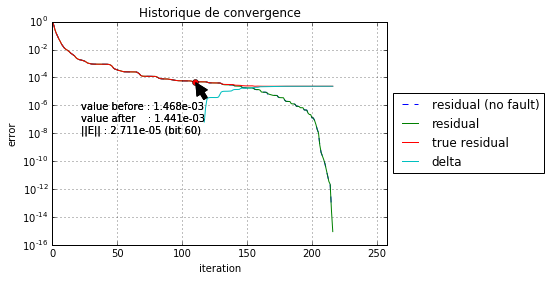

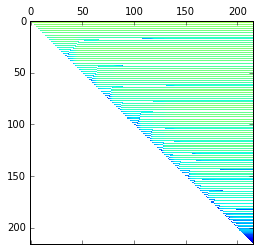

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0024410847648022442, 'register': 'left', 'timer': 115, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0023901002177238988, 'check': None}


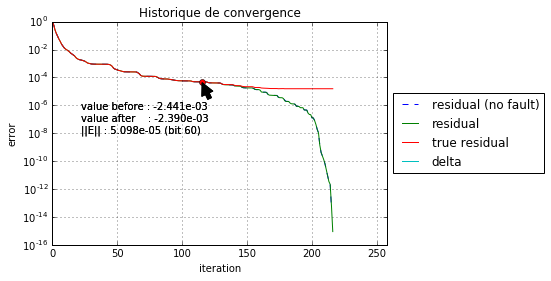

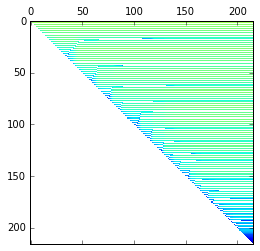

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00419489517009767, 'register': 'left', 'timer': 120, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0040110630908545214, 'check': None}


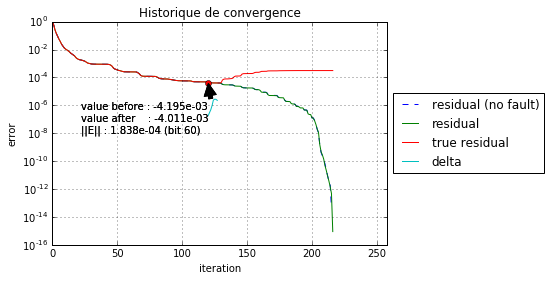

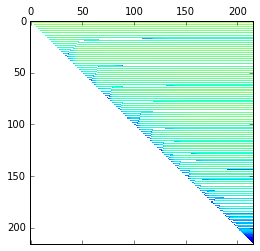

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0021117665840187797, 'register': 'left', 'timer': 125, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0020863404334105669, 'check': None}


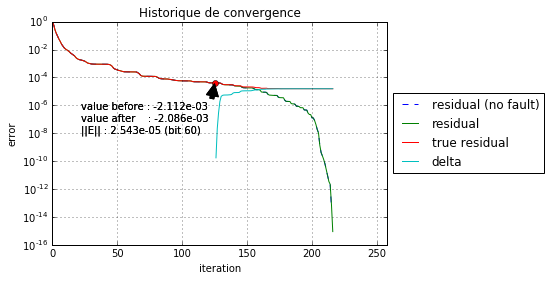

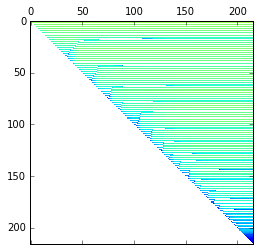

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.002368959793186313, 'register': 'left', 'timer': 130, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0023241871564291345, 'check': None}


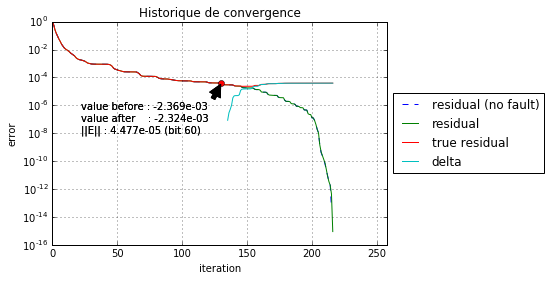

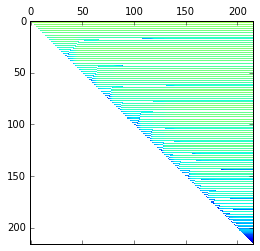

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0027827048368757744, 'register': 'left', 'timer': 135, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0024905649753131976, 'check': None}


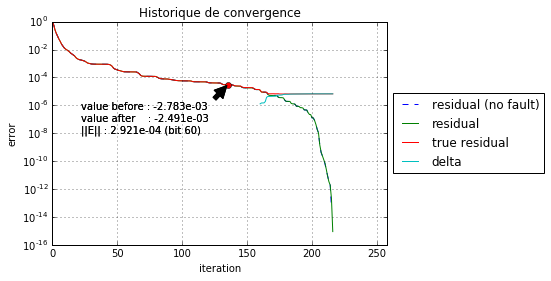

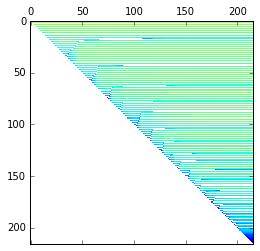

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0002279602396086437, 'register': 'left', 'timer': 140, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00055014376784758956, 'check': None}


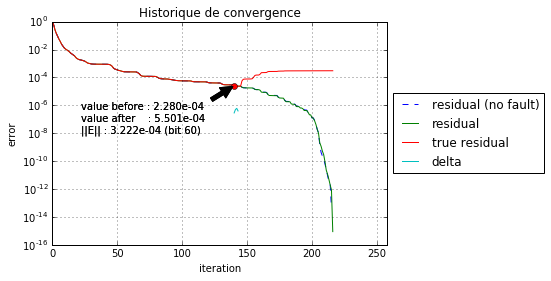

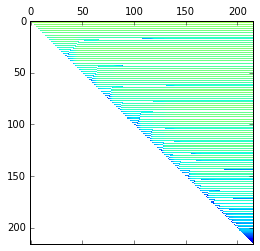

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.002851055105710573, 'register': 'left', 'timer': 145, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0027520673941819878, 'check': None}


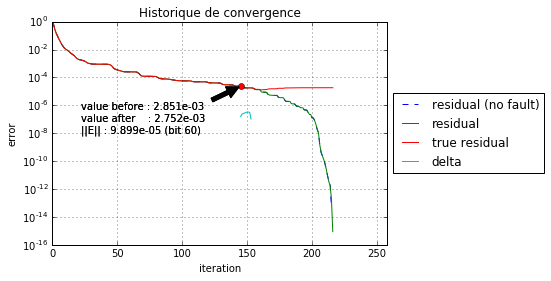

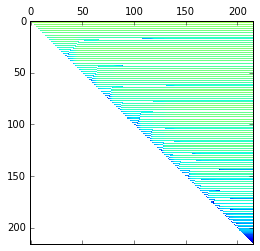

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00045102304273231941, 'register': 'left', 'timer': 150, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -7.5423901092941609e-05, 'check': None}


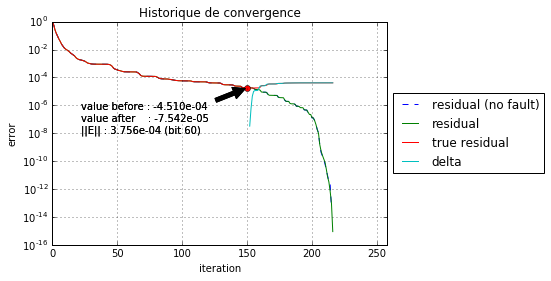

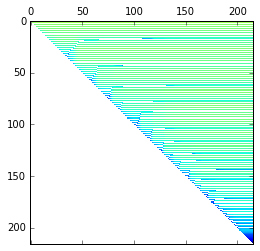

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0017968518305698043, 'register': 'left', 'timer': 155, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0019210694979067146, 'check': None}


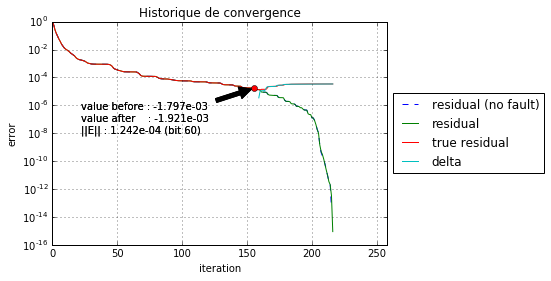

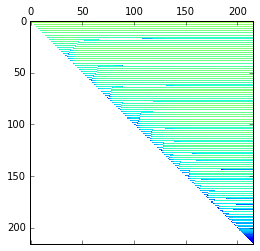

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.00036706115216851055, 'register': 'left', 'timer': 160, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00033894876969250563, 'check': None}


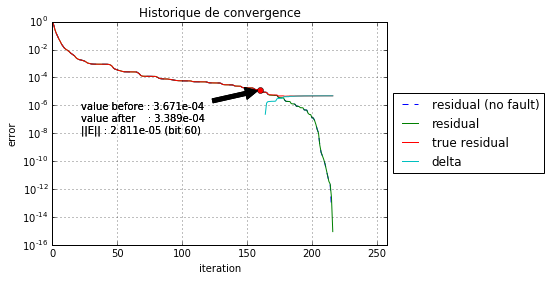

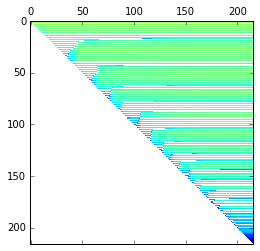

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0008217343139551007, 'register': 'left', 'timer': 165, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00095250256530095647, 'check': None}


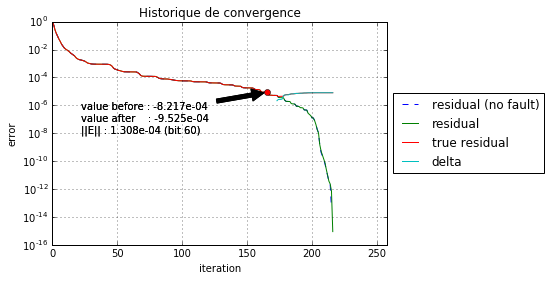

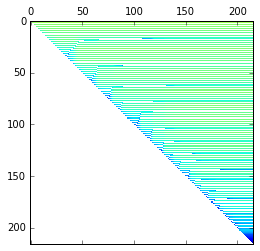

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.00046394607112118329, 'register': 'left', 'timer': 170, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.00040608973010411236, 'check': None}


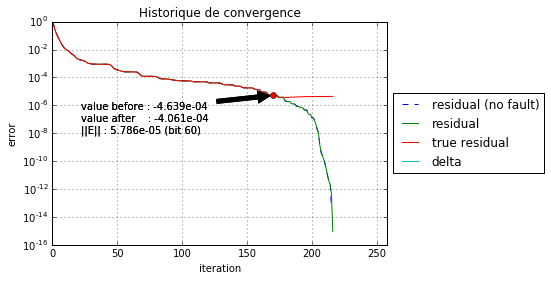

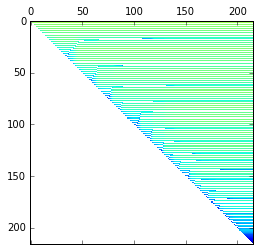

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.002652047472601813, 'register': 'left', 'timer': 175, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.002912245554875314, 'check': None}


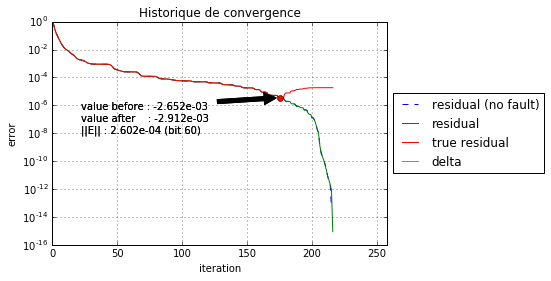

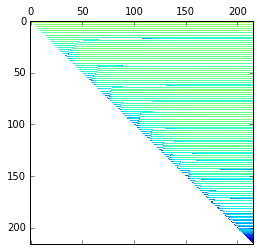

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -0.0011603294246908429, 'register': 'left', 'timer': 180, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -0.0010596115305408422, 'check': None}


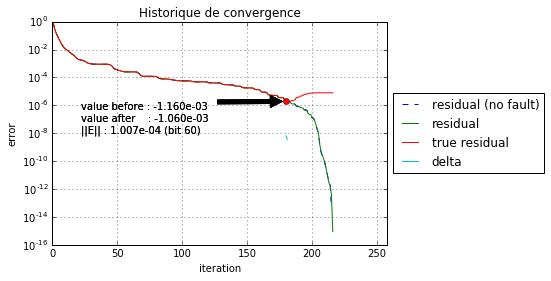

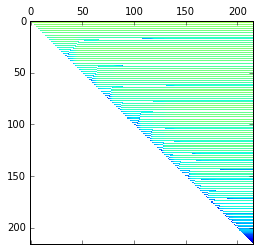

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0016399285904540747, 'register': 'left', 'timer': 185, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0015561878328152997, 'check': None}


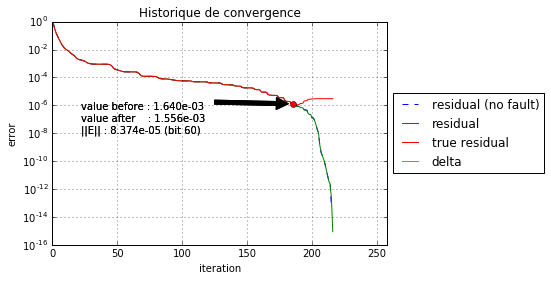

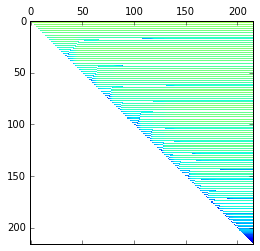

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.00046784033847182096, 'register': 'left', 'timer': 190, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.00044846355654037489, 'check': None}


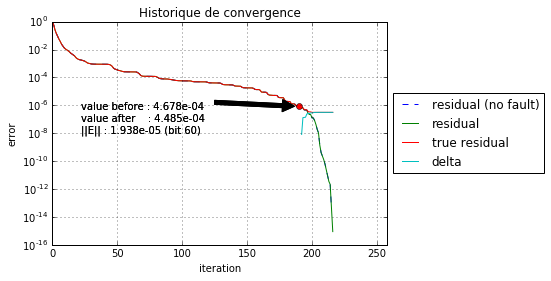

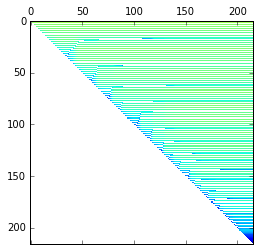

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 0.0010819108999854795, 'register': 'left', 'timer': 195, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 0.0011222975330503124, 'check': None}


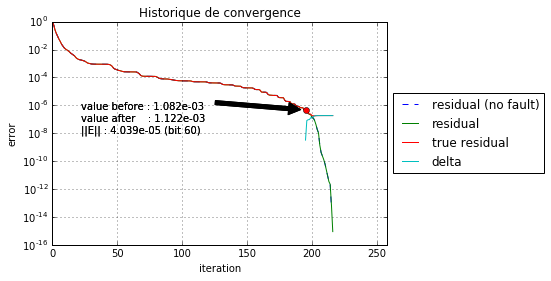

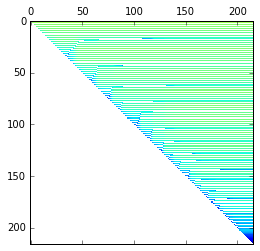

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 1.4704087343350733e-05, 'register': 'left', 'timer': 200, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 2.1161481059362449e-05, 'check': None}


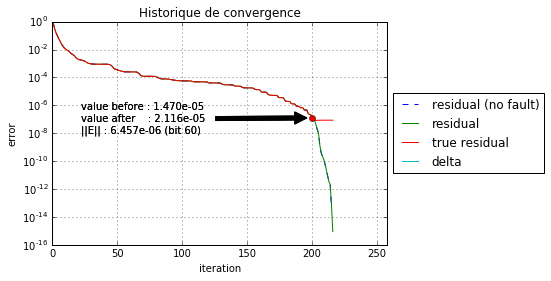

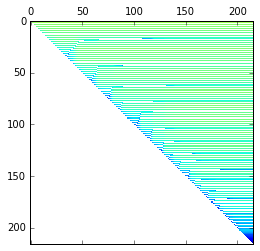

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': 2.2361307624170452e-08, 'register': 'left', 'timer': 205, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': -4.1903275722177925e-06, 'check': None}


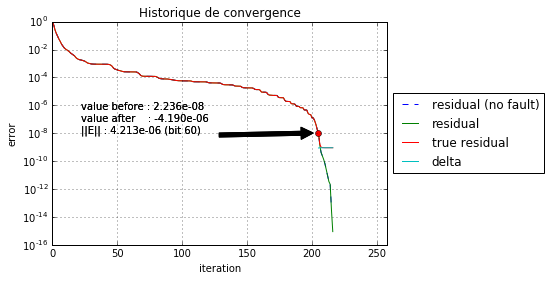

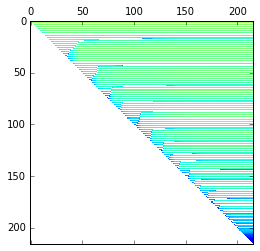

animation
{'register_before': -0.0023017506848013502, 'loc': {'i': 197, 'k': 161, 'j': 0}, 'value_before': -6.7930228818722333e-09, 'register': 'left', 'timer': 210, 'register_after': -1.9878306885748525e-80, 'bit': 60, 'value_after': 3.8585439744823557e-06, 'check': None}


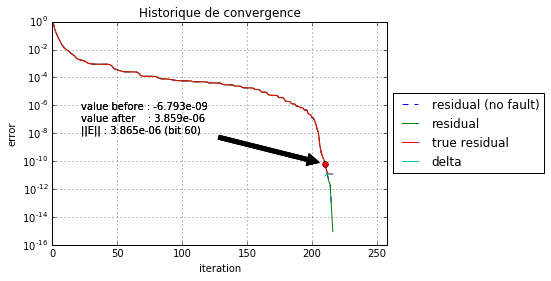

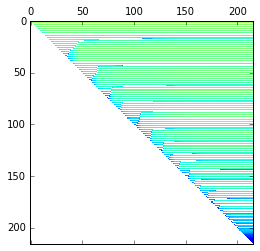

animation


In [19]:
%matplotlib inline

if True:
    
    #data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    
    #data_faults = map(lambda d: d["faults"], data)
    data_faults = map(lambda d: d["faults"], data)
    
    #data_H = map(lambda d: d["H"], data)
    #data_V = map(lambda d: d["V"], data)
    #data_orthogonality = map(lambda d: d["orthogonality"], data)
    #data_arnoldi = map(lambda d: d["arnoldi"], data)
    #data_V_ = map(lambda d: d["V_"], data)
    data_iteration = map(lambda d: d["iteration_count"], data)
    data_errors = map(lambda d: d["residuals"], data)
    data_true_errors = map(lambda d: d["true_residuals"], data)
    data_errors_ = map(lambda d: d["residuals"], data)
    data_true_errors_ = map(lambda d: d["true_residuals"], data)
    data_y = map(lambda d: d["y"], data)
    
    
    XT = np.arange(0, F.get_data('iteration_count')[0]+1)
    YT = F.get_data('residuals')[0]
    ZT = F.get_data('true_residuals')[0]
    #OT = F.get_data('orthogonality')[0]
    #AT = F.get_data('arnoldi')[0]
        

    for i in xrange(min(len(data_faults), 2000)):
        X = np.arange(0, data_iteration[i]+1)
        Y = data_errors[i]
        Z = data_true_errors[i]
        #O = data_orthogonality[i]
        #A = data_arnoldi[i]
        
        k = data_faults[i][0]["timer"]
        ylk = []
        D = []
        E_norm = abs(data_faults[i][0]["register_after"] - data_faults[i][0]["register_before"])
        Ekvk = abs(data_faults[i][0]["value_after"] - data_faults[i][0]["value_before"])
        
        Y_mat = np.zeros((n, data_iteration[i]))
        for l in xrange(data_iteration[i]):
            yl = data_y[i][min(len(data_y[i])-1, l)]
            if (k > yl.shape[0] - 1):
                ylk += [0.]
            else:
                ylk += [yl[k]]
            for ll in xrange(len(yl)):
                Y_mat[ll, l] = yl[ll]
            for ll in xrange(n-len(yl)):
                Y_mat[ll+len(yl)] = 0
            D += [(ylk[-1] * Ekvk) / np.linalg.norm(b)]
            
        ylk += [ylk[-1]]
        D += [(ylk[-1] * Ekvk) / np.linalg.norm(b)]
        xlim = [0, int(F.get_data('iteration_count')[0] * 1.2)]
        ylim = [1.e-16, 1.e+0]
        xlabel = "iteration"
        ylabel = "error"
        #plot_2D(X, H, log=False, xlim=xlim, ylim=[-2., 2.])
        #plt.show()
        plot_2D(XT, YT, log=True, title='Historique de convergence', label = "residual (no fault)", linestyle='--', xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)  
        
        
        plot_2D(X, Y, log=True, title='Historique de convergence', label = "residual", xlabel=xlabel, xlim=xlim, ylabel=ylabel, ylim=ylim)
        plot_2D(X, Z, log=True, title='Historique de convergence', label = "true residual", xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)
        
        plot_2D(X, D, log=True, title='Historique de convergence', label = "delta", xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)
   

        #plot_2D(XT, OT, log=True, title='Historique de convergence', label = "Orthogonality (no fault)", linestyle='--')  
        #plot_2D(X, O, log=True, title='Historique de convergence', label = "Orthogonality")
  
        #plot_2D(XT, AT, log=True, title='Historique de convergence', label = "Arnoldi equalition (no fault)", linestyle='--')  
        #plot_2D(X, A, log=True, title='Historique de convergence', label = "Arnoldi equalition")
 

        x = (data_faults[i][0]['timer'])
        y = data_true_errors[i][x]
        y_ = data_true_errors_[i][x]
        print data_faults[i][0]
        if data_faults[i][0]["check"]:
            c = "green"
        elif data_faults[i][0]["check"] == False:
            c = "yellow"
        else:
            c = "red"
        plt.plot([x], [y], 'ro', c=c)
        #plt.plot([x], [y_], 'ro', c="green" if data_faults[i][0]["check"] else "red")
        annotation = "value before : %.3e \nvalue after    : %.3e \n||E|| : %.3e (bit %d)" % (data_faults[i][0]['value_before'], 
                                                                                               data_faults[i][0]['value_after'], 
                                                                                               abs(data_faults[i][0]['value_before']-data_faults[i][0]['value_after']),
                                                                                               data_faults[i][0]['bit'])
        plt.annotate(annotation, xy=(x, y), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.annotate(annotation, xy=(x, y_), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.show()
        
        plt.matshow(Y_mat, aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
        plt.show()
        
        print "animation"
        if False:
            fig1 = plt.figure(figsize = [15,7])
    
            ax1 = fig1.add_subplot(131, autoscale_on=True, title = "H (with fault)")
            ax2 = fig1.add_subplot(132, autoscale_on=True, title = "H (without fault)")
            ax3 = fig1.add_subplot(133, autoscale_on=True, title = "Difference")
    
            fig2 = plt.figure(figsize = [15,7])
    
            ax4 = fig2.add_subplot(131, autoscale_on=True, title = "V (with fault)")
            ax5 = fig2.add_subplot(132, autoscale_on=True, title = "V (without fault)")
            ax6 = fig2.add_subplot(133, autoscale_on=True, title = "Difference")
            
            #fig3 = plt.figure(figsize = [15,7])
    
            #ax7 = fig3.add_subplot(131, autoscale_on=True, title = "V not orthogonalized (with fault)")
            #ax8 = fig3.add_subplot(132, autoscale_on=True, title = "V not orthogonalized (without fault)")
            #ax9 = fig3.add_subplot(133, autoscale_on=True, title = "Difference")
    
    
            iteration = min(F.get_data("iteration_count")[0], data_iteration[i])
    
            ax1.matshow(data_H[i][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax2.matshow(F.get_data("H")[0][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax3 = ax3.matshow(abs(data_H[i][:iteration+1, :iteration]-F.get_data("H")[0][:iteration+1, :iteration])[:iteration+1,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    
            ax4.matshow(data_V[i][:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax5.matshow((F.get_data("V")[0])[:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax6 = ax6.matshow(abs(data_V[i][:, :iteration]-F.get_data("V")[0][:, :iteration])[:,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8),  cmap=plt.get_cmap('jet'))
    
            #ax7.matshow(data_V_[i][:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #ax8.matshow((F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #cax9 = ax9.matshow(abs(data_V_[i]-F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    

            fig1.colorbar(cax3)
            fig2.colorbar(cax6)
            #fig3.colorbar(cax9)
        plt.show()